In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/seoulbikedata/SeoulBikeData.csv


In [2]:
# INPUT REQUIRE - Creating placeholder for data path
bikeData = "/kaggle/input/seoulbikedata/SeoulBikeData.csv"

In [3]:
pip install chardet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.1/199.1 kB 4.4 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [4]:
import chardet
with open(bikeData, 'rb') as rawdata:
    result = chardet.detect(rawdata.read(100000))
result

{'encoding': 'ISO-8859-9',
 'confidence': 0.7583842623371586,
 'language': 'Turkish'}

In [5]:
# Load datasets
dfBike = pd.read_csv(bikeData, encoding='ISO-8859-9')

In [6]:
dfBike.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


**Date is in dd/mm/yyyy format**

In [7]:
# Check the data first for two columns 'Date' 'Hour', and 'Rented Bike Count'

# Convert the date column to datetime
# Adding new columns Month, Year, Year-Month
dfBike['Date'] = pd.to_datetime(dfBike['Date'], format='%d/%m/%Y')

# Extract the month from the date
dfBike['Month'] = dfBike['Date'].dt.month
dfBike['Year'] = dfBike['Date'].dt.year
dfBike['Year-Month'] = dfBike['Year'].astype(str) + '-' + dfBike['Month'].astype(str)

print("dfBike['Month'].unique()", dfBike['Month'].unique())
print("dfBike['Year'].unique()", dfBike['Year'].unique())

unique_dates = pd.DataFrame(columns=['Month-Year', 'Counts'])

for Year in dfBike['Year'].unique():
    for Month in dfBike['Month'].unique():
        print("For ", Month,"-", Year)
        
        # Select dates based on year and month
        target_match = str(Year) + "-" + str(Month)
        
        matched_rows = dfBike[dfBike['Year-Month'] == target_match]
        
        unique_dates = unique_dates.append({'Month-Year': target_match, 'Counts': matched_rows['Date'].nunique()}, ignore_index=True)
        
        #print("matched_rows['Date'].unique()", matched_rows['Date'].unique())
        
        print("Number of unique dates ", matched_rows['Date'].nunique())
        
        
unique_dates
        


dfBike['Month'].unique() [12  1  2  3  4  5  6  7  8  9 10 11]
dfBike['Year'].unique() [2017 2018]
For  12 - 2017
Number of unique dates  31
For  1 - 2017
Number of unique dates  0
For  2 - 2017
Number of unique dates  0
For  3 - 2017
Number of unique dates  0
For  4 - 2017
Number of unique dates  0
For  5 - 2017
Number of unique dates  0
For  6 - 2017
Number of unique dates  0
For  7 - 2017
Number of unique dates  0
For  8 - 2017
Number of unique dates  0
For  9 - 2017
Number of unique dates  0
For  10 - 2017
Number of unique dates  0
For  11 - 2017
Number of unique dates  0
For  12 - 2018
Number of unique dates  0
For  1 - 2018
Number of unique dates  31
For  2 - 2018
Number of unique dates  28
For  3 - 2018
Number of unique dates  31
For  4 - 2018
Number of unique dates  30
For  5 - 2018
Number of unique dates  31
For  6 - 2018
Number of unique dates  30
For  7 - 2018
Number of unique dates  31
For  8 - 2018
Number of unique dates  31
For  9 - 2018
Number of unique dates  30
For  10

,Month-Year,Counts
0,2017-12,31
1,2017-1,0
2,2017-2,0
3,2017-3,0
4,2017-4,0
5,2017-5,0
6,2017-6,0
7,2017-7,0
8,2017-8,0
9,2017-9,0


In [8]:
# Check for dates having 0 unique values

matched_rows = dfBike[dfBike['Year-Month'] == "2018-12"]
matched_rows['Date']

Series([], Name: Date, dtype: datetime64[ns])

In [9]:
dfBike.columns

Index(['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day', 'Month', 'Year', 'Year-Month'],
      dtype='object')

In [10]:
# Creating alternative Dataframe to perform deep dive on 'Date','Hour','Rented Bike Count','Year-Month'
monthly_df = dfBike[['Date','Hour','Rented Bike Count','Year-Month', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day']]
monthly_df.head()

,Date,Hour,Rented Bike Count,Year-Month,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,2017-12-01,0,254,2017-12,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,2017-12-01,1,204,2017-12,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,2017-12-01,2,173,2017-12,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,2017-12-01,3,107,2017-12,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,2017-12-01,4,78,2017-12,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [11]:
# Create pivot table
pivot_table = monthly_df.pivot_table(index='Date', columns='Hour', values='Rented Bike Count', aggfunc='sum')
print(pivot_table)

Hour         0    1    2    3    4    5    6    7     8    9   ...   14   15  \
Date                                                           ...             
2017-12-01  254  204  173  107   78  100  181  460   930  490  ...  447  463   
2017-12-02  328  308  262  167   89   79   70  146   219  328  ...  611  589   
2017-12-03  342  227  228  117   76   32   13   22    85  152  ...  563  621   
2017-12-04  285  186  112   65   41   82  200  498   937  509  ...  338  341   
2017-12-05  216  198  124   62   42   82  172  381   812  462  ...  334  353   
...         ...  ...  ...  ...  ...  ...  ...  ...   ...  ...  ...  ...  ...   
2018-11-26  387  214  175  119   99  115  339  819  1524  795  ...  796  794   
2018-11-27  496  408  299  183   95  140  317  815  1577  800  ...  600  666   
2018-11-28  450  434  275  167  128  140  287  796  1540  798  ...  675  798   
2018-11-29  517  485  319  195  107  126  328  800  1635  825  ...  668  652   
2018-11-30  474  456  300  213  116  149

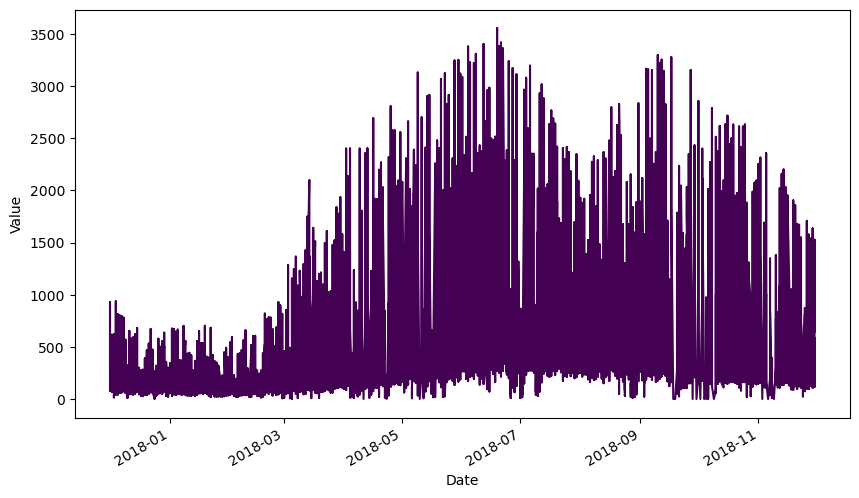

In [12]:
# Reset the index
pivot_table = pivot_table.reset_index()

# Reshape the data
melted_data = pd.melt(pivot_table, id_vars='Date', value_vars=list(range(24)), var_name='Hour', value_name='Value')

# Create a line chart with the viridis colormap
fig, ax = plt.subplots(figsize=(10, 6))
melted_data.plot(x='Date', y='Value', kind='line', ax=ax, cmap='viridis', legend=False)
ax.set_xlabel('Date')
ax.set_ylabel('Value')
plt.show()

In [13]:
# Drill down at Monthly level
for month_yr in monthly_df['Year-Month'].unique():
    print(month_yr)
    select_dates = monthly_df[(monthly_df['Year-Month'] == month_yr)]
    print(select_dates['Date'])
    
    
#monthly_df_drill = month

2017-12
0     2017-12-01
1     2017-12-01
2     2017-12-01
3     2017-12-01
4     2017-12-01
         ...    
739   2017-12-31
740   2017-12-31
741   2017-12-31
742   2017-12-31
743   2017-12-31
Name: Date, Length: 744, dtype: datetime64[ns]
2018-1
744    2018-01-01
745    2018-01-01
746    2018-01-01
747    2018-01-01
748    2018-01-01
          ...    
1483   2018-01-31
1484   2018-01-31
1485   2018-01-31
1486   2018-01-31
1487   2018-01-31
Name: Date, Length: 744, dtype: datetime64[ns]
2018-2
1488   2018-02-01
1489   2018-02-01
1490   2018-02-01
1491   2018-02-01
1492   2018-02-01
          ...    
2155   2018-02-28
2156   2018-02-28
2157   2018-02-28
2158   2018-02-28
2159   2018-02-28
Name: Date, Length: 672, dtype: datetime64[ns]
2018-3
2160   2018-03-01
2161   2018-03-01
2162   2018-03-01
2163   2018-03-01
2164   2018-03-01
          ...    
2899   2018-03-31
2900   2018-03-31
2901   2018-03-31
2902   2018-03-31
2903   2018-03-31
Name: Date, Length: 744, dtype: datetime64[ns]
20

In [14]:
monthly_df.columns

Index(['Date', 'Hour', 'Rented Bike Count', 'Year-Month', 'Temperature(°C)',
       'Humidity(%)', 'Wind speed (m/s)', 'Visibility (10m)',
       'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)',
       'Snowfall (cm)', 'Seasons', 'Holiday', 'Functioning Day'],
      dtype='object')

2017-12
0     2017-12-01
1     2017-12-01
2     2017-12-01
3     2017-12-01
4     2017-12-01
         ...    
739   2017-12-31
740   2017-12-31
741   2017-12-31
742   2017-12-31
743   2017-12-31
Name: Date, Length: 744, dtype: datetime64[ns]


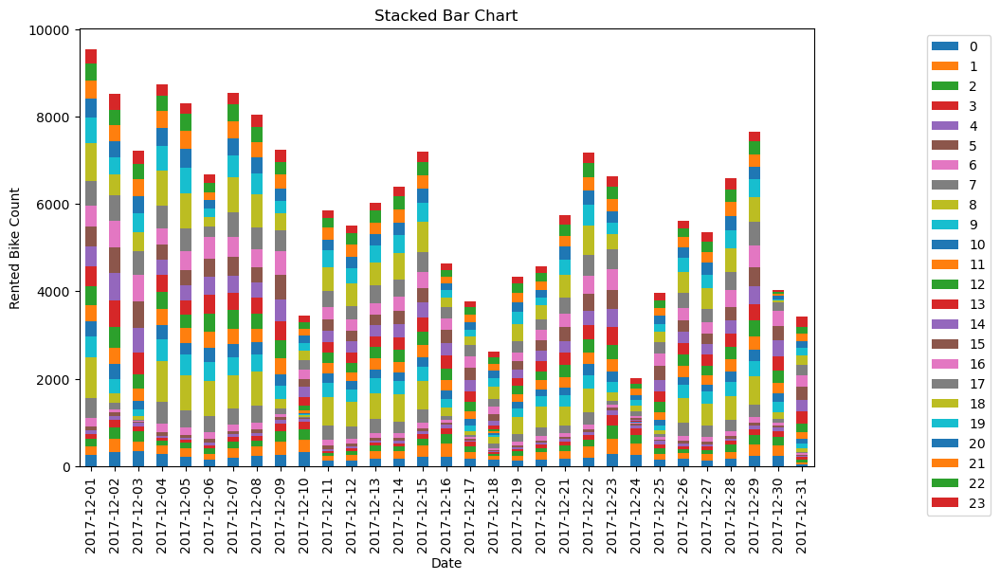

2018-1
744    2018-01-01
745    2018-01-01
746    2018-01-01
747    2018-01-01
748    2018-01-01
          ...    
1483   2018-01-31
1484   2018-01-31
1485   2018-01-31
1486   2018-01-31
1487   2018-01-31
Name: Date, Length: 744, dtype: datetime64[ns]


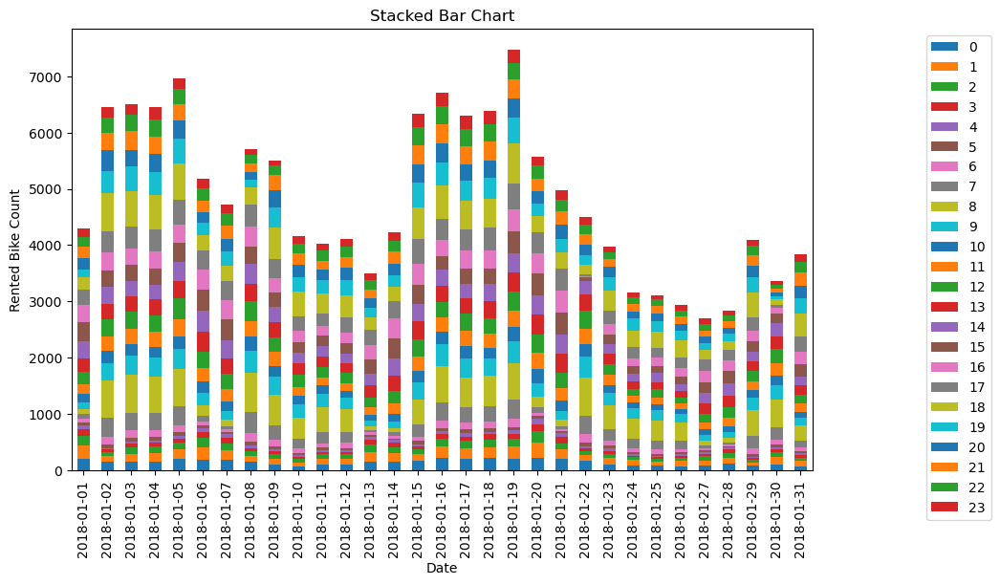

2018-2
1488   2018-02-01
1489   2018-02-01
1490   2018-02-01
1491   2018-02-01
1492   2018-02-01
          ...    
2155   2018-02-28
2156   2018-02-28
2157   2018-02-28
2158   2018-02-28
2159   2018-02-28
Name: Date, Length: 672, dtype: datetime64[ns]


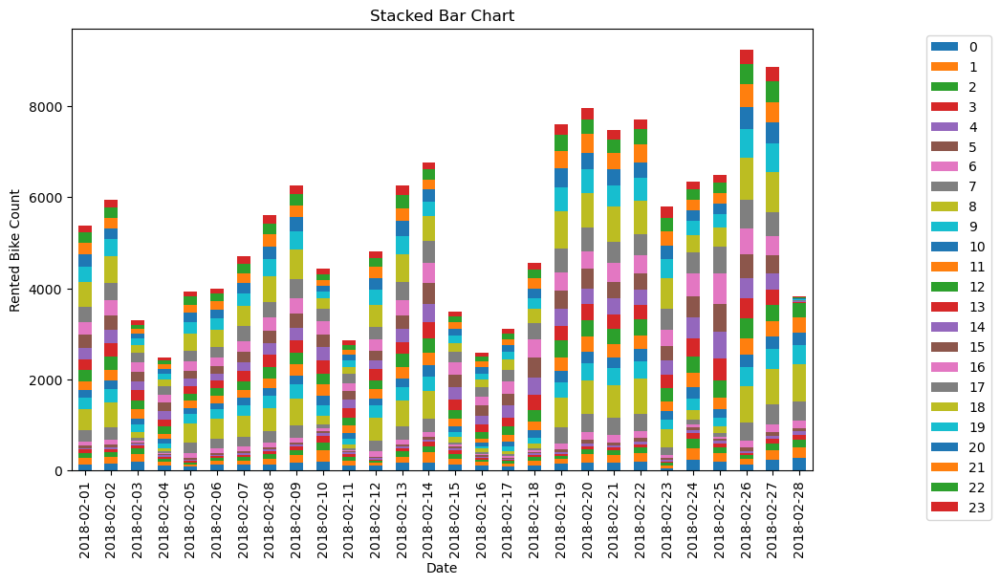

2018-3
2160   2018-03-01
2161   2018-03-01
2162   2018-03-01
2163   2018-03-01
2164   2018-03-01
          ...    
2899   2018-03-31
2900   2018-03-31
2901   2018-03-31
2902   2018-03-31
2903   2018-03-31
Name: Date, Length: 744, dtype: datetime64[ns]


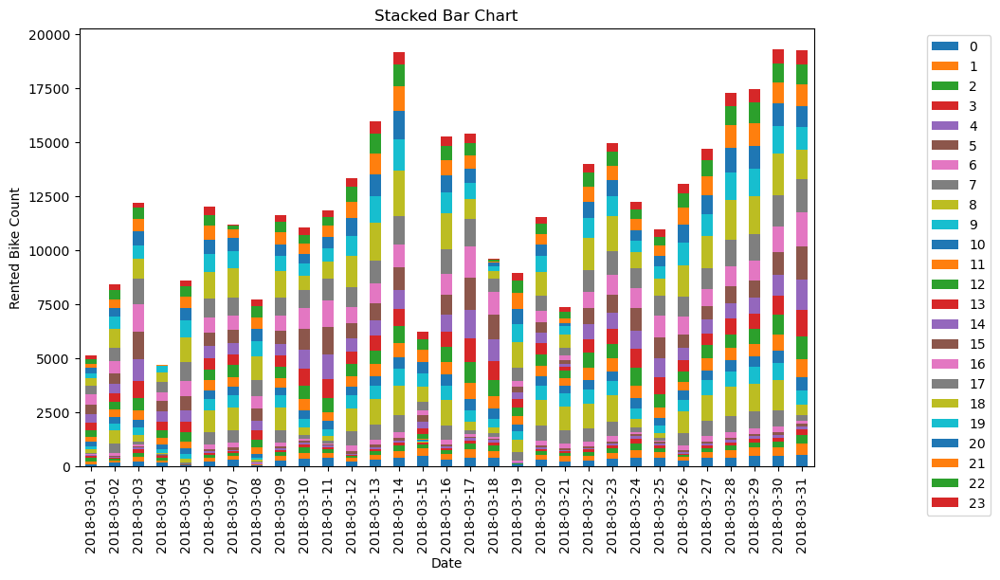

2018-4
2904   2018-04-01
2905   2018-04-01
2906   2018-04-01
2907   2018-04-01
2908   2018-04-01
          ...    
3619   2018-04-30
3620   2018-04-30
3621   2018-04-30
3622   2018-04-30
3623   2018-04-30
Name: Date, Length: 720, dtype: datetime64[ns]


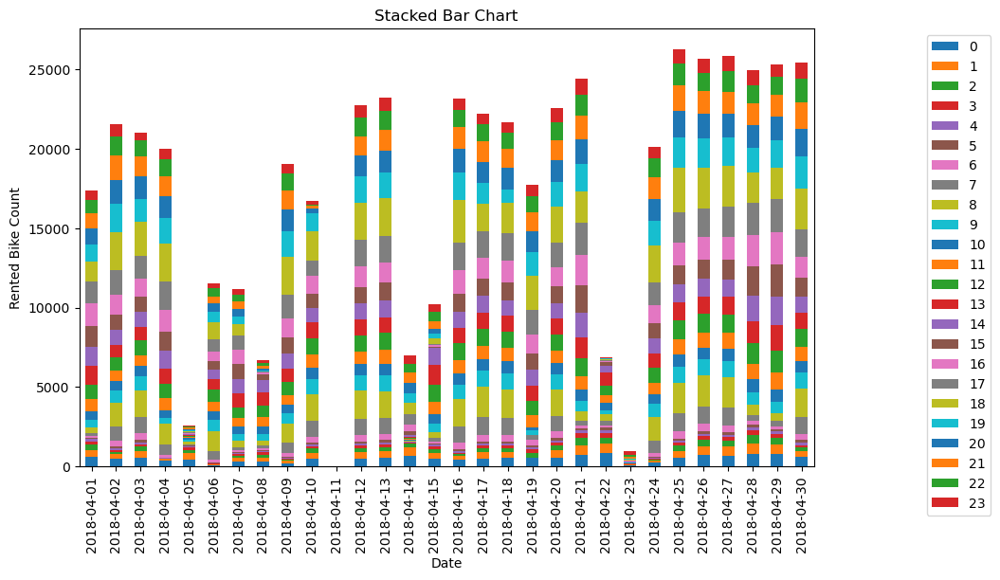

2018-5
3624   2018-05-01
3625   2018-05-01
3626   2018-05-01
3627   2018-05-01
3628   2018-05-01
          ...    
4363   2018-05-31
4364   2018-05-31
4365   2018-05-31
4366   2018-05-31
4367   2018-05-31
Name: Date, Length: 744, dtype: datetime64[ns]


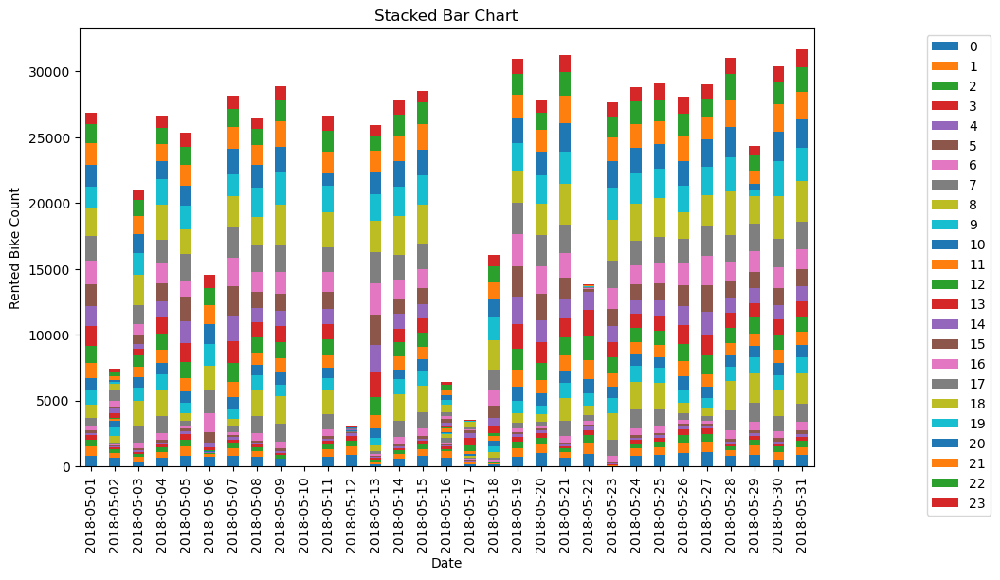

2018-6
4368   2018-06-01
4369   2018-06-01
4370   2018-06-01
4371   2018-06-01
4372   2018-06-01
          ...    
5083   2018-06-30
5084   2018-06-30
5085   2018-06-30
5086   2018-06-30
5087   2018-06-30
Name: Date, Length: 720, dtype: datetime64[ns]


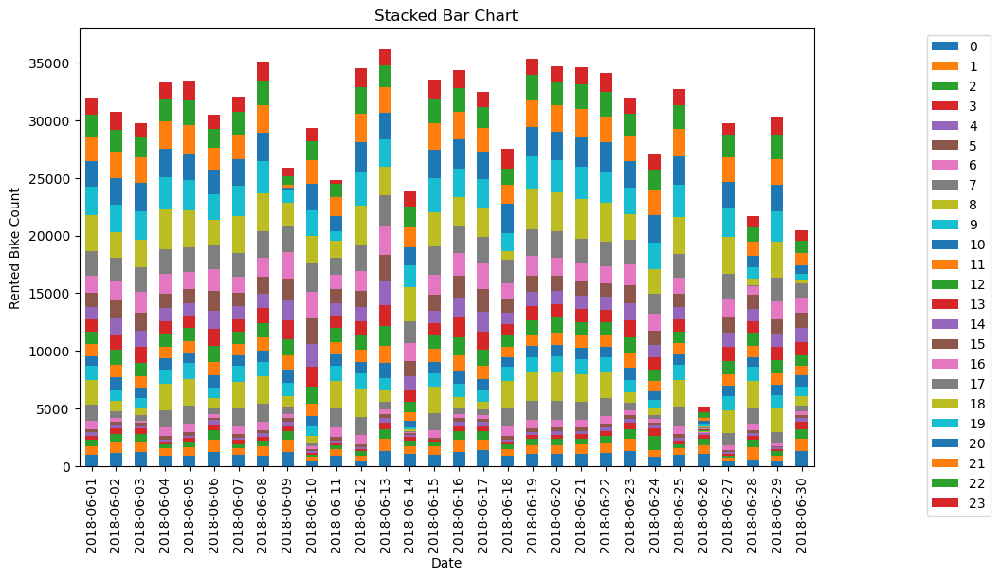

2018-7
5088   2018-07-01
5089   2018-07-01
5090   2018-07-01
5091   2018-07-01
5092   2018-07-01
          ...    
5827   2018-07-31
5828   2018-07-31
5829   2018-07-31
5830   2018-07-31
5831   2018-07-31
Name: Date, Length: 744, dtype: datetime64[ns]


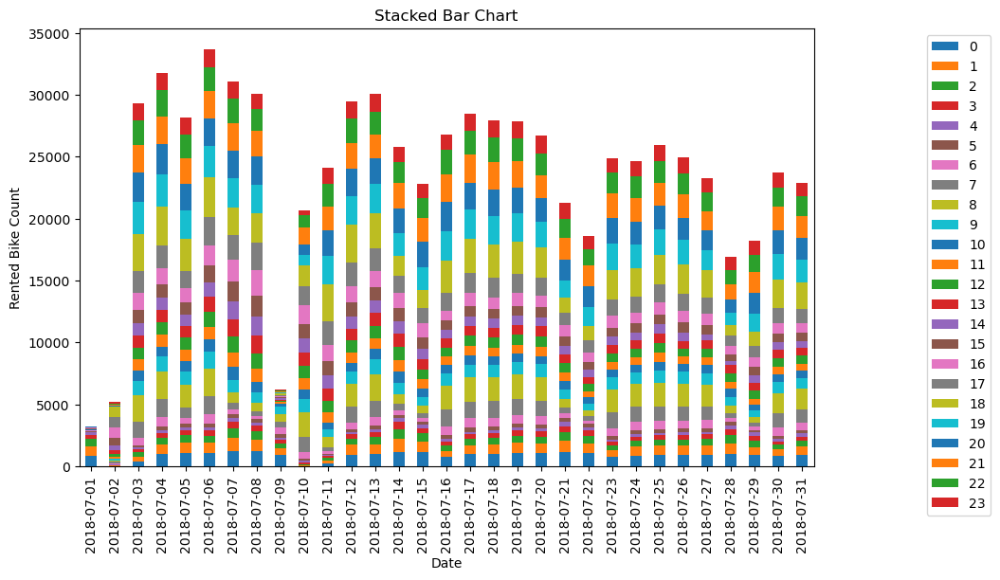

2018-8
5832   2018-08-01
5833   2018-08-01
5834   2018-08-01
5835   2018-08-01
5836   2018-08-01
          ...    
6571   2018-08-31
6572   2018-08-31
6573   2018-08-31
6574   2018-08-31
6575   2018-08-31
Name: Date, Length: 744, dtype: datetime64[ns]


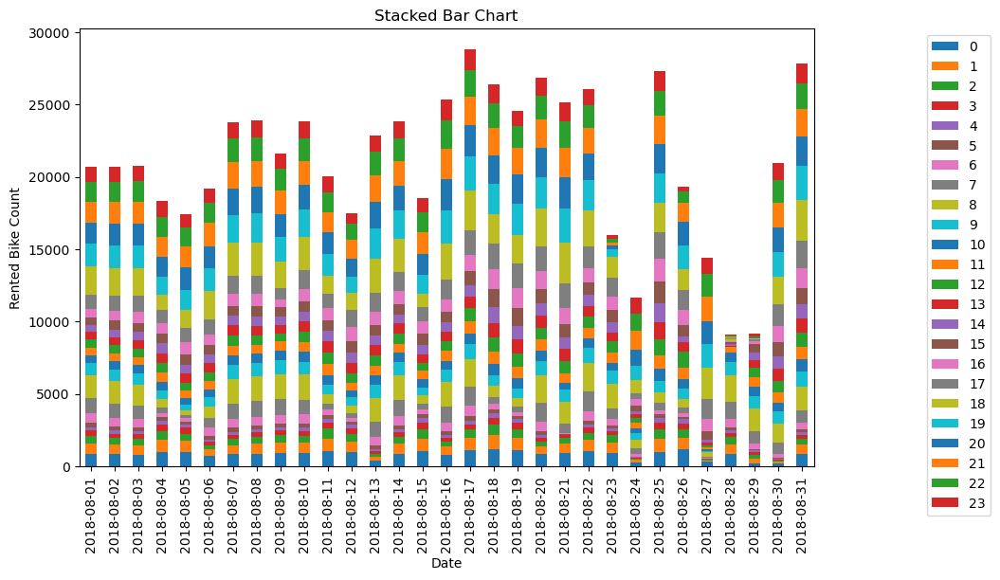

2018-9
6576   2018-09-01
6577   2018-09-01
6578   2018-09-01
6579   2018-09-01
6580   2018-09-01
          ...    
7291   2018-09-30
7292   2018-09-30
7293   2018-09-30
7294   2018-09-30
7295   2018-09-30
Name: Date, Length: 720, dtype: datetime64[ns]


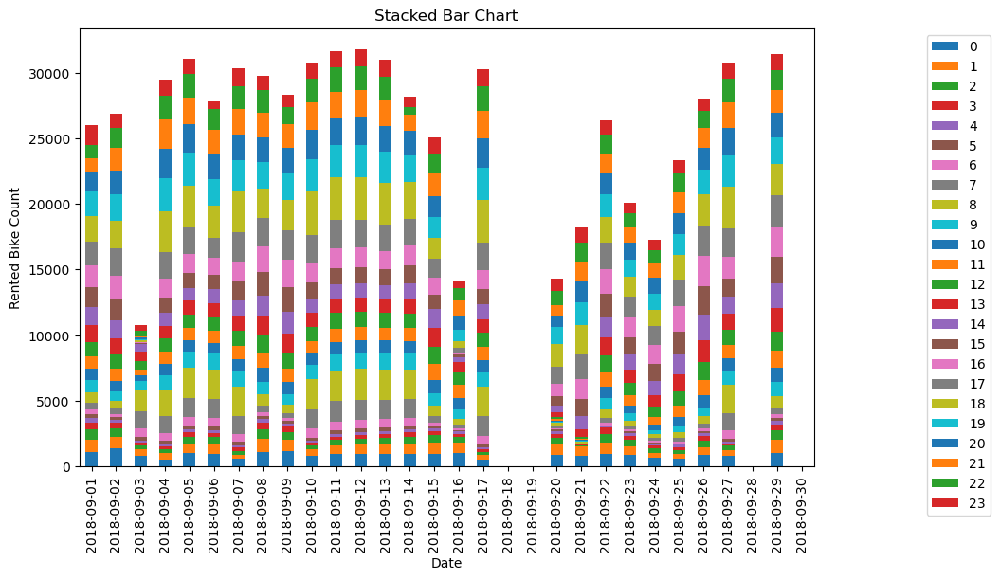

2018-10
7296   2018-10-01
7297   2018-10-01
7298   2018-10-01
7299   2018-10-01
7300   2018-10-01
          ...    
8035   2018-10-31
8036   2018-10-31
8037   2018-10-31
8038   2018-10-31
8039   2018-10-31
Name: Date, Length: 744, dtype: datetime64[ns]


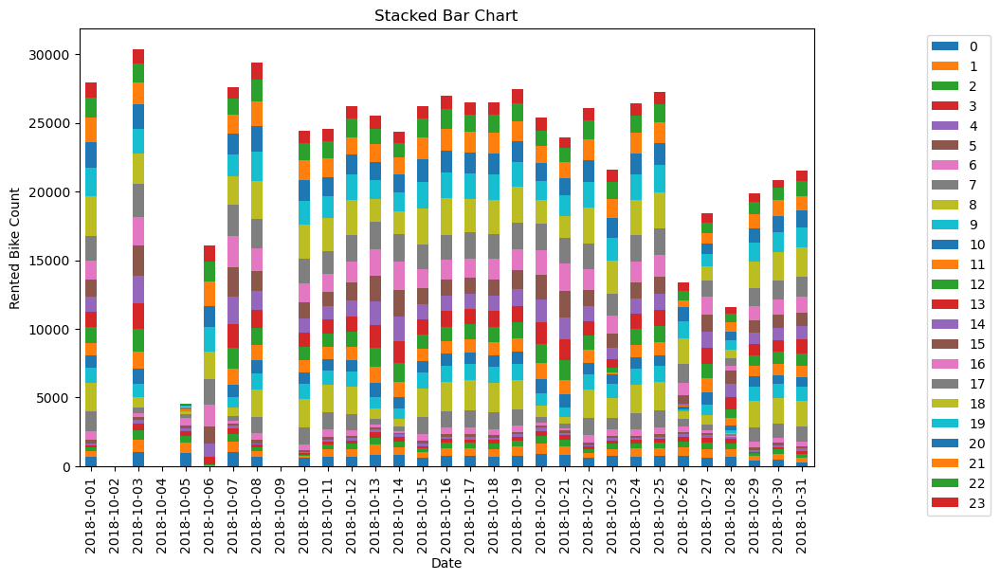

2018-11
8040   2018-11-01
8041   2018-11-01
8042   2018-11-01
8043   2018-11-01
8044   2018-11-01
          ...    
8755   2018-11-30
8756   2018-11-30
8757   2018-11-30
8758   2018-11-30
8759   2018-11-30
Name: Date, Length: 720, dtype: datetime64[ns]


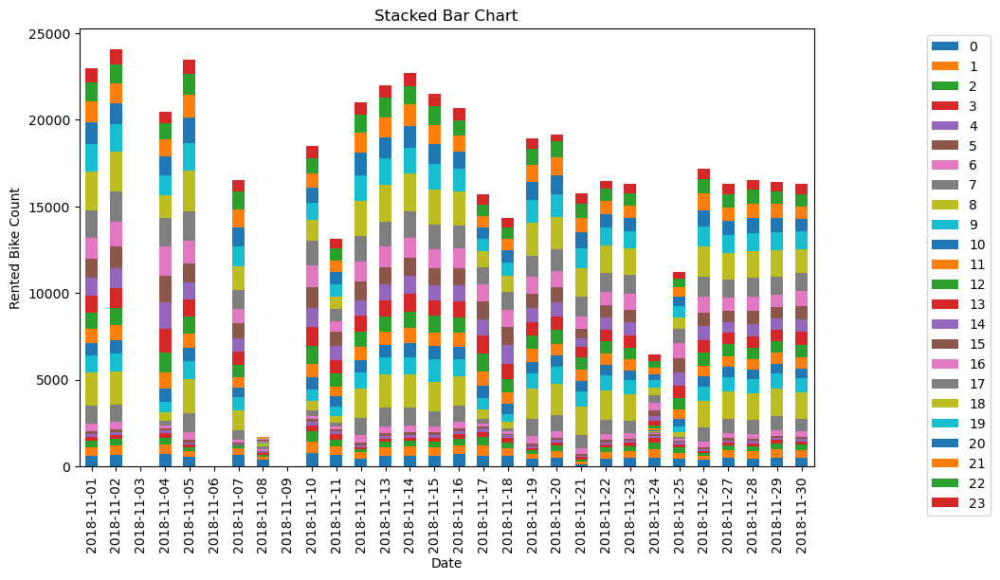

In [15]:
# Drill down at Monthly level visualization using Stacked Bar Chart
for month_yr in monthly_df['Year-Month'].unique():
    print(month_yr)
    select_dates = monthly_df[(monthly_df['Year-Month'] == month_yr)]
    print(select_dates['Date'])
    
    # Create a pivot table with Category as rows, Subcategory as columns, and Value as values
    pivot_table = select_dates.pivot_table(values = 'Rented Bike Count', index = 'Date', columns = 'Hour', aggfunc='sum')
    pivot_table.index = pivot_table.index.date
    
    #pivot_table = monthly_df.pivot_table(index='Date', columns='Hour', values='Rented Bike Count', aggfunc='sum')

    # Plot the pivot table as a stacked bar chart
    pivot_table.plot(kind='bar', stacked=True, figsize=(10, 6))

    # Add a title and axis labels
    plt.title('Stacked Bar Chart')
    plt.xlabel('Date')
    plt.ylabel('Rented Bike Count')
    plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1))

    # Show the plot
    plt.show()

2017-12
0     2017-12-01
1     2017-12-01
2     2017-12-01
3     2017-12-01
4     2017-12-01
         ...    
739   2017-12-31
740   2017-12-31
741   2017-12-31
742   2017-12-31
743   2017-12-31
Name: Date, Length: 744, dtype: datetime64[ns]


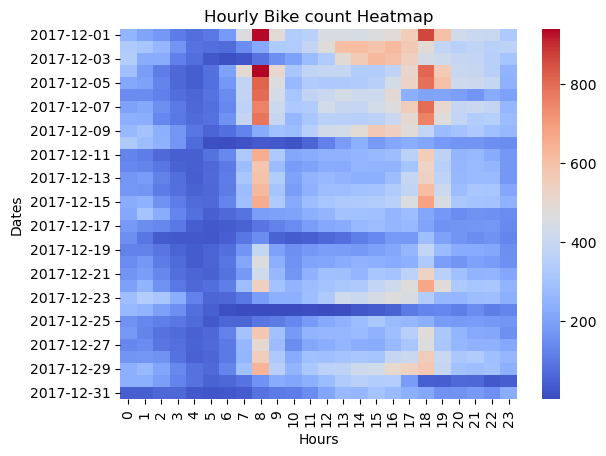

2018-1
744    2018-01-01
745    2018-01-01
746    2018-01-01
747    2018-01-01
748    2018-01-01
          ...    
1483   2018-01-31
1484   2018-01-31
1485   2018-01-31
1486   2018-01-31
1487   2018-01-31
Name: Date, Length: 744, dtype: datetime64[ns]


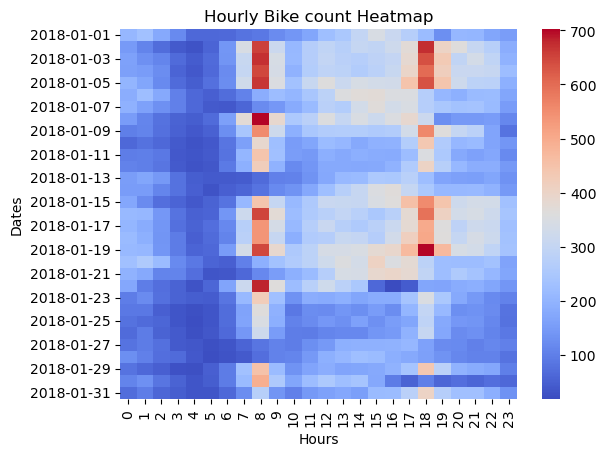

2018-2
1488   2018-02-01
1489   2018-02-01
1490   2018-02-01
1491   2018-02-01
1492   2018-02-01
          ...    
2155   2018-02-28
2156   2018-02-28
2157   2018-02-28
2158   2018-02-28
2159   2018-02-28
Name: Date, Length: 672, dtype: datetime64[ns]


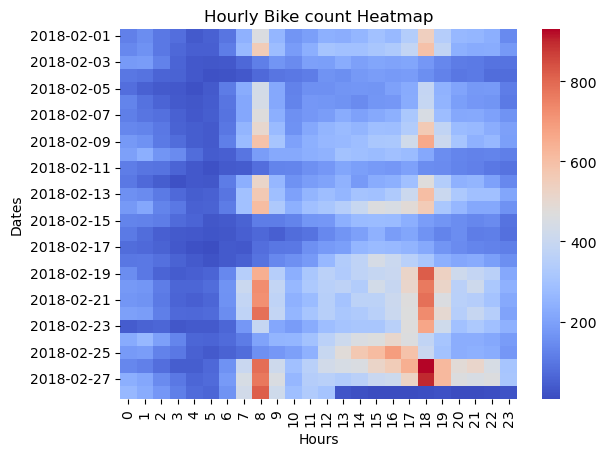

2018-3
2160   2018-03-01
2161   2018-03-01
2162   2018-03-01
2163   2018-03-01
2164   2018-03-01
          ...    
2899   2018-03-31
2900   2018-03-31
2901   2018-03-31
2902   2018-03-31
2903   2018-03-31
Name: Date, Length: 744, dtype: datetime64[ns]


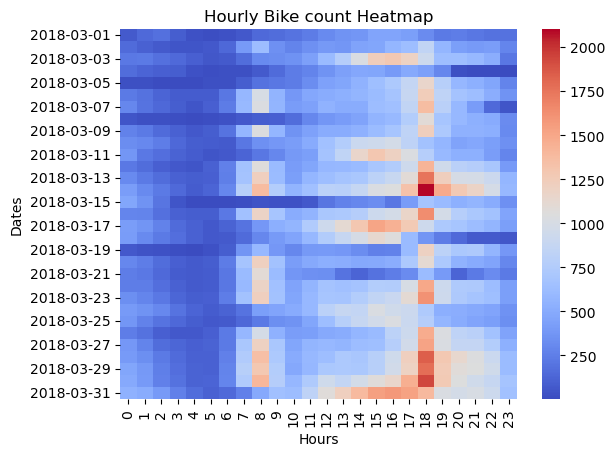

2018-4
2904   2018-04-01
2905   2018-04-01
2906   2018-04-01
2907   2018-04-01
2908   2018-04-01
          ...    
3619   2018-04-30
3620   2018-04-30
3621   2018-04-30
3622   2018-04-30
3623   2018-04-30
Name: Date, Length: 720, dtype: datetime64[ns]


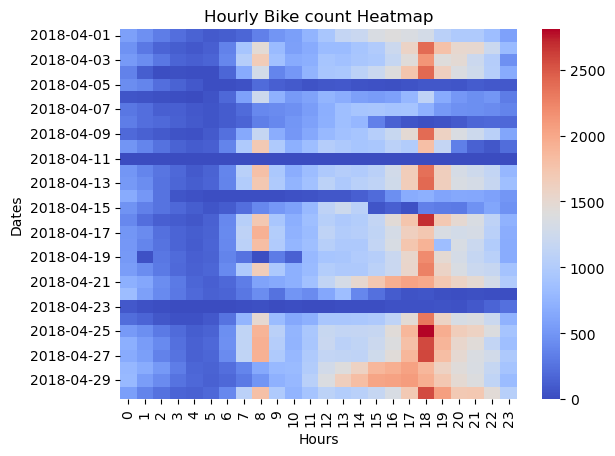

2018-5
3624   2018-05-01
3625   2018-05-01
3626   2018-05-01
3627   2018-05-01
3628   2018-05-01
          ...    
4363   2018-05-31
4364   2018-05-31
4365   2018-05-31
4366   2018-05-31
4367   2018-05-31
Name: Date, Length: 744, dtype: datetime64[ns]


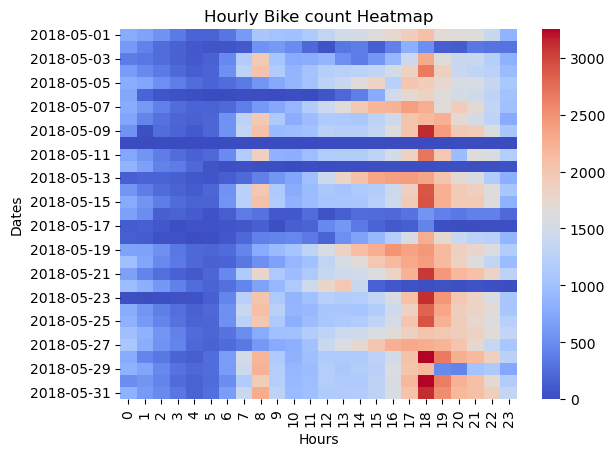

2018-6
4368   2018-06-01
4369   2018-06-01
4370   2018-06-01
4371   2018-06-01
4372   2018-06-01
          ...    
5083   2018-06-30
5084   2018-06-30
5085   2018-06-30
5086   2018-06-30
5087   2018-06-30
Name: Date, Length: 720, dtype: datetime64[ns]


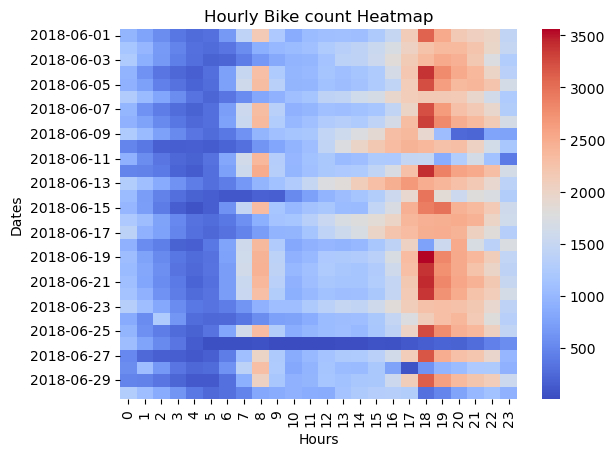

2018-7
5088   2018-07-01
5089   2018-07-01
5090   2018-07-01
5091   2018-07-01
5092   2018-07-01
          ...    
5827   2018-07-31
5828   2018-07-31
5829   2018-07-31
5830   2018-07-31
5831   2018-07-31
Name: Date, Length: 744, dtype: datetime64[ns]


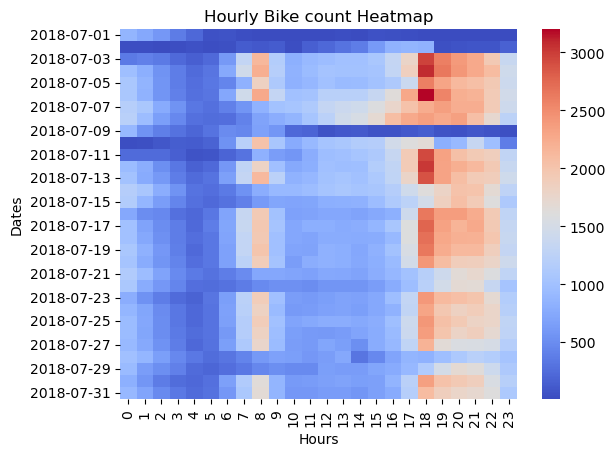

2018-8
5832   2018-08-01
5833   2018-08-01
5834   2018-08-01
5835   2018-08-01
5836   2018-08-01
          ...    
6571   2018-08-31
6572   2018-08-31
6573   2018-08-31
6574   2018-08-31
6575   2018-08-31
Name: Date, Length: 744, dtype: datetime64[ns]


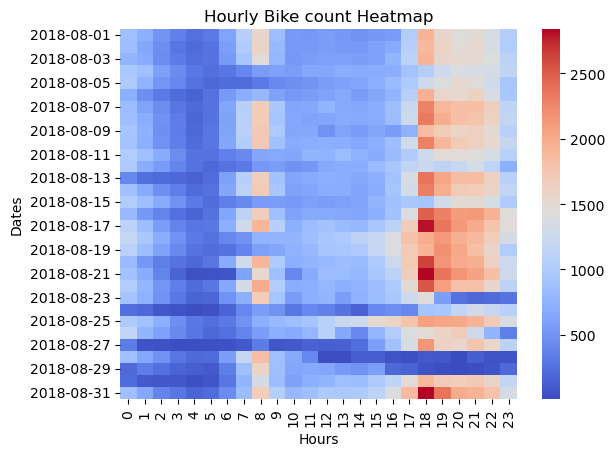

2018-9
6576   2018-09-01
6577   2018-09-01
6578   2018-09-01
6579   2018-09-01
6580   2018-09-01
          ...    
7291   2018-09-30
7292   2018-09-30
7293   2018-09-30
7294   2018-09-30
7295   2018-09-30
Name: Date, Length: 720, dtype: datetime64[ns]


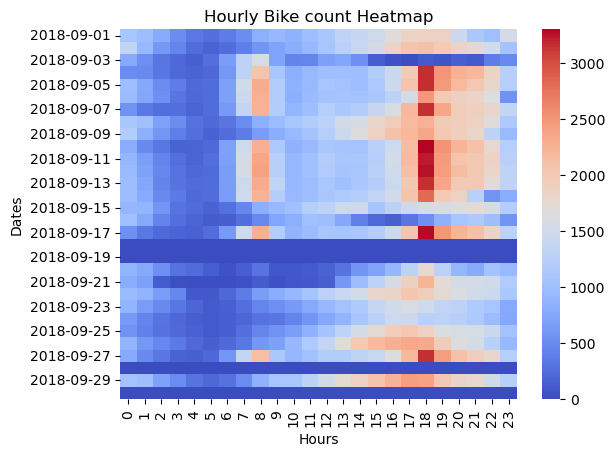

2018-10
7296   2018-10-01
7297   2018-10-01
7298   2018-10-01
7299   2018-10-01
7300   2018-10-01
          ...    
8035   2018-10-31
8036   2018-10-31
8037   2018-10-31
8038   2018-10-31
8039   2018-10-31
Name: Date, Length: 744, dtype: datetime64[ns]


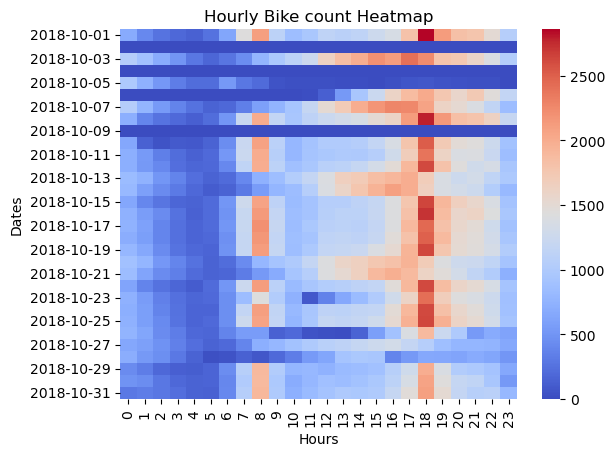

2018-11
8040   2018-11-01
8041   2018-11-01
8042   2018-11-01
8043   2018-11-01
8044   2018-11-01
          ...    
8755   2018-11-30
8756   2018-11-30
8757   2018-11-30
8758   2018-11-30
8759   2018-11-30
Name: Date, Length: 720, dtype: datetime64[ns]


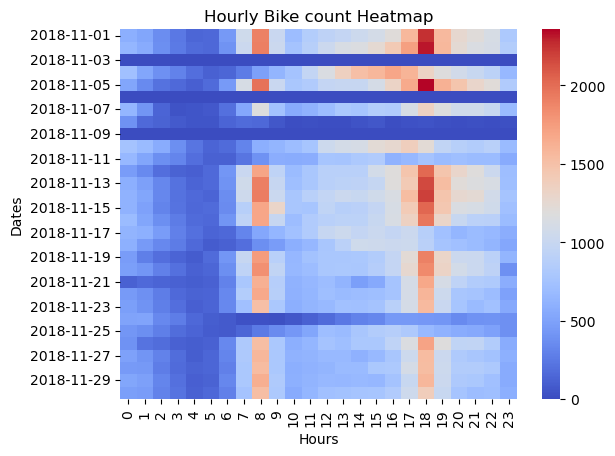

In [16]:
# Drill down at Monthly level visualization using Heatmap
for month_yr in monthly_df['Year-Month'].unique():
    print(month_yr)
    select_dates = monthly_df[(monthly_df['Year-Month'] == month_yr)]
    print(select_dates['Date'])
    
    # Create a pivot table with Category as rows, Subcategory as columns, and Value as values
    pivot_table = select_dates.pivot_table(values = 'Rented Bike Count', index = 'Date', columns = 'Hour')
    pivot_table.index = pivot_table.index.date
    
    #pivot_table = monthly_df.pivot_table(index='Date', columns='Hour', values='Rented Bike Count', aggfunc='sum')

    sns.heatmap(pivot_table, cmap='coolwarm')
    plt.xlabel('Hours')
    plt.ylabel('Dates')
    plt.title('Hourly Bike count Heatmap')
    plt.show()

#     # Add a title and axis labels
#     plt.title('Stacked Bar Chart')
#     plt.xlabel('Date')
#     plt.ylabel('Rented Bike Count')

    # Show the plot
    plt.show()

In [17]:
# Standardizing "Rented Bike Count" column
from sklearn.preprocessing import StandardScaler
# assuming the column you want to standardize is called "Rented Bike Count"
scaler = StandardScaler()
monthly_df['Rented Bike Count_standardized'] = scaler.fit_transform(monthly_df[['Rented Bike Count']])
monthly_df.head()
monthly_df.describe()

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


,Hour,Rented Bike Count,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Rented Bike Count_standardized
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8.760000e+03
mean,11.500000,704.602055,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068,3.893385e-17
std,6.922582,644.997468,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746,1.000057e+00
min,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000,-1.092473e+00
25%,5.750000,191.000000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000,-7.963308e-01
50%,11.500000,504.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000,-3.102547e-01
75%,17.250000,1065.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000,5.591782e-01
max,23.000000,3556.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000,4.421042e+00


2017-12
0     2017-12-01
1     2017-12-01
2     2017-12-01
3     2017-12-01
4     2017-12-01
         ...    
739   2017-12-31
740   2017-12-31
741   2017-12-31
742   2017-12-31
743   2017-12-31
Name: Date, Length: 744, dtype: datetime64[ns]


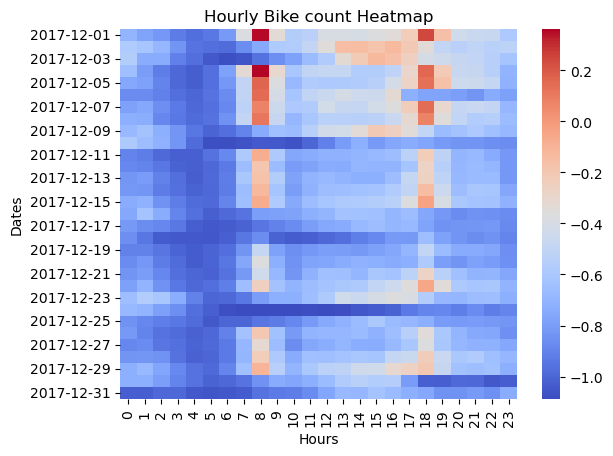

2018-1
744    2018-01-01
745    2018-01-01
746    2018-01-01
747    2018-01-01
748    2018-01-01
          ...    
1483   2018-01-31
1484   2018-01-31
1485   2018-01-31
1486   2018-01-31
1487   2018-01-31
Name: Date, Length: 744, dtype: datetime64[ns]


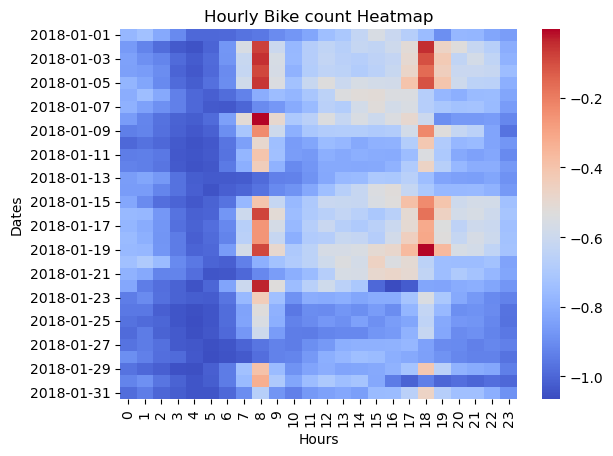

2018-2
1488   2018-02-01
1489   2018-02-01
1490   2018-02-01
1491   2018-02-01
1492   2018-02-01
          ...    
2155   2018-02-28
2156   2018-02-28
2157   2018-02-28
2158   2018-02-28
2159   2018-02-28
Name: Date, Length: 672, dtype: datetime64[ns]


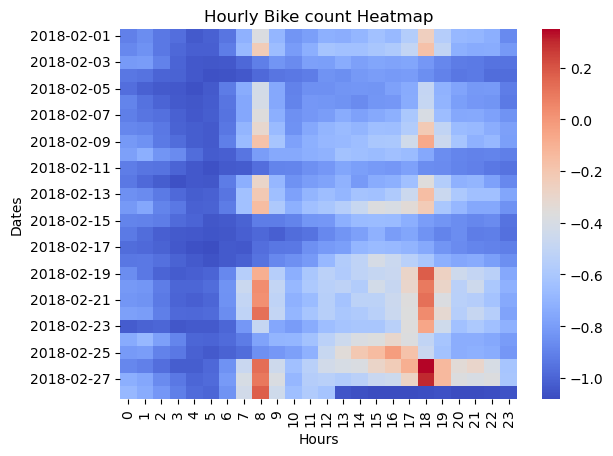

2018-3
2160   2018-03-01
2161   2018-03-01
2162   2018-03-01
2163   2018-03-01
2164   2018-03-01
          ...    
2899   2018-03-31
2900   2018-03-31
2901   2018-03-31
2902   2018-03-31
2903   2018-03-31
Name: Date, Length: 744, dtype: datetime64[ns]


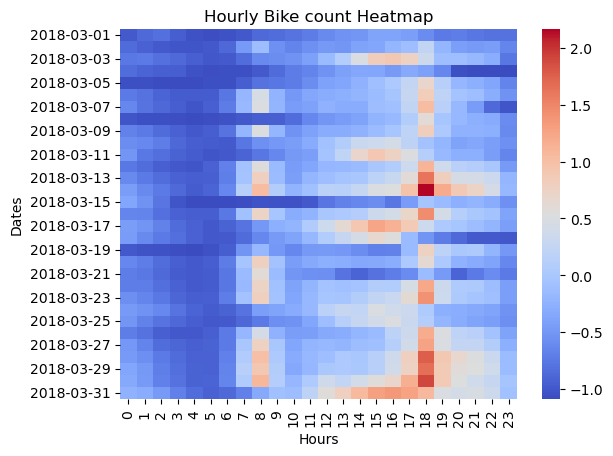

2018-4
2904   2018-04-01
2905   2018-04-01
2906   2018-04-01
2907   2018-04-01
2908   2018-04-01
          ...    
3619   2018-04-30
3620   2018-04-30
3621   2018-04-30
3622   2018-04-30
3623   2018-04-30
Name: Date, Length: 720, dtype: datetime64[ns]


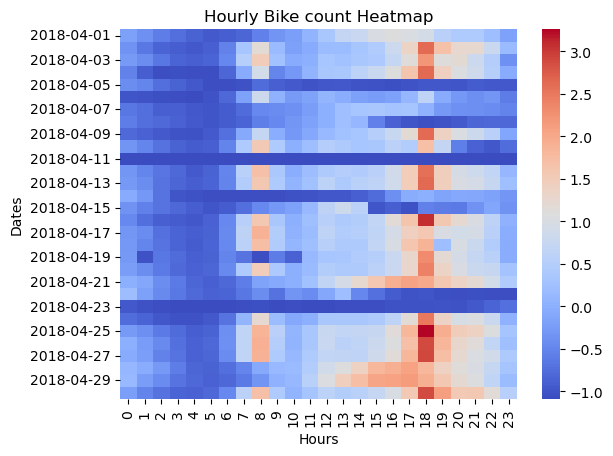

2018-5
3624   2018-05-01
3625   2018-05-01
3626   2018-05-01
3627   2018-05-01
3628   2018-05-01
          ...    
4363   2018-05-31
4364   2018-05-31
4365   2018-05-31
4366   2018-05-31
4367   2018-05-31
Name: Date, Length: 744, dtype: datetime64[ns]


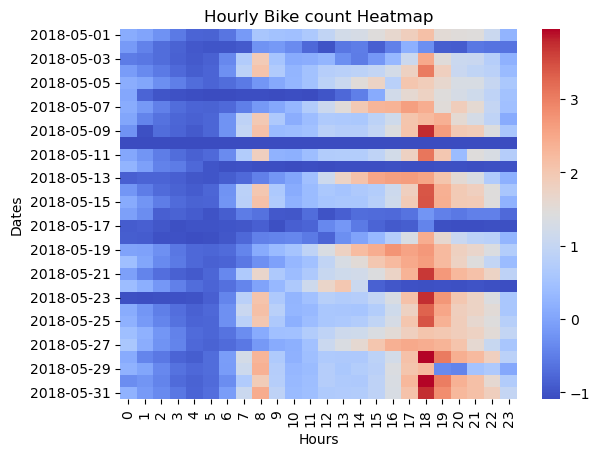

2018-6
4368   2018-06-01
4369   2018-06-01
4370   2018-06-01
4371   2018-06-01
4372   2018-06-01
          ...    
5083   2018-06-30
5084   2018-06-30
5085   2018-06-30
5086   2018-06-30
5087   2018-06-30
Name: Date, Length: 720, dtype: datetime64[ns]


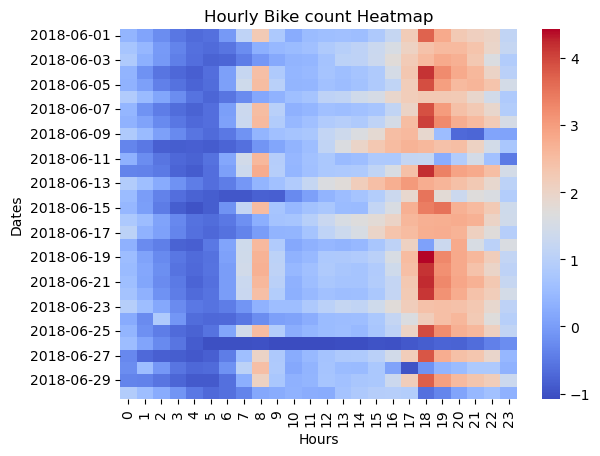

2018-7
5088   2018-07-01
5089   2018-07-01
5090   2018-07-01
5091   2018-07-01
5092   2018-07-01
          ...    
5827   2018-07-31
5828   2018-07-31
5829   2018-07-31
5830   2018-07-31
5831   2018-07-31
Name: Date, Length: 744, dtype: datetime64[ns]


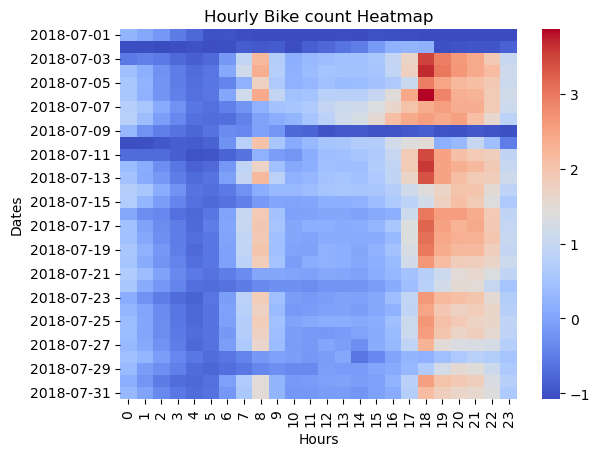

2018-8
5832   2018-08-01
5833   2018-08-01
5834   2018-08-01
5835   2018-08-01
5836   2018-08-01
          ...    
6571   2018-08-31
6572   2018-08-31
6573   2018-08-31
6574   2018-08-31
6575   2018-08-31
Name: Date, Length: 744, dtype: datetime64[ns]


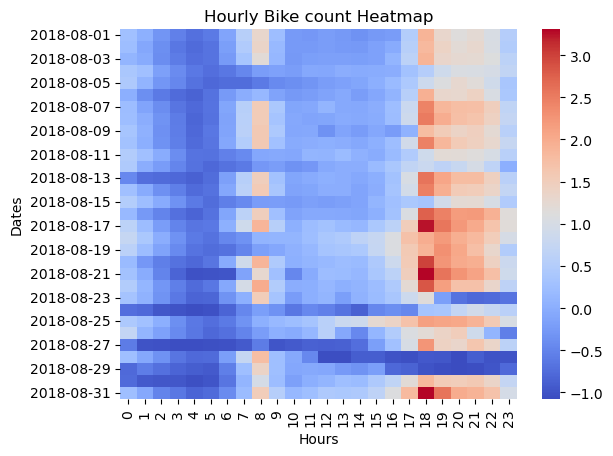

2018-9
6576   2018-09-01
6577   2018-09-01
6578   2018-09-01
6579   2018-09-01
6580   2018-09-01
          ...    
7291   2018-09-30
7292   2018-09-30
7293   2018-09-30
7294   2018-09-30
7295   2018-09-30
Name: Date, Length: 720, dtype: datetime64[ns]


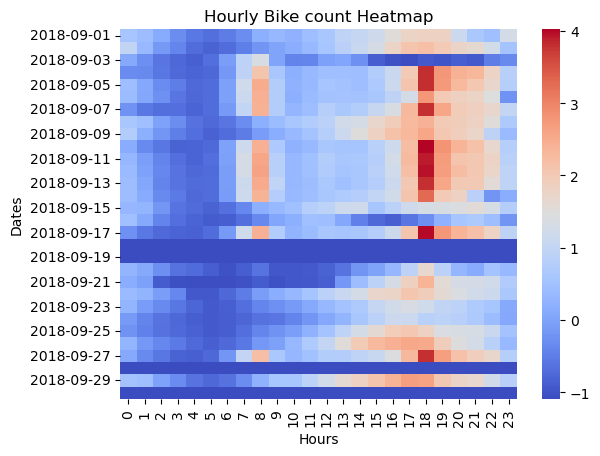

2018-10
7296   2018-10-01
7297   2018-10-01
7298   2018-10-01
7299   2018-10-01
7300   2018-10-01
          ...    
8035   2018-10-31
8036   2018-10-31
8037   2018-10-31
8038   2018-10-31
8039   2018-10-31
Name: Date, Length: 744, dtype: datetime64[ns]


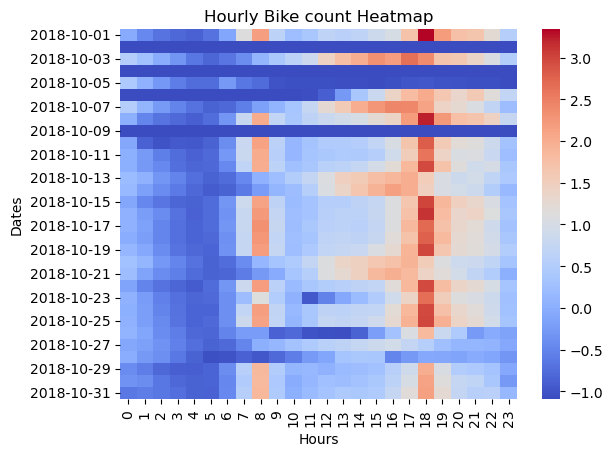

2018-11
8040   2018-11-01
8041   2018-11-01
8042   2018-11-01
8043   2018-11-01
8044   2018-11-01
          ...    
8755   2018-11-30
8756   2018-11-30
8757   2018-11-30
8758   2018-11-30
8759   2018-11-30
Name: Date, Length: 720, dtype: datetime64[ns]


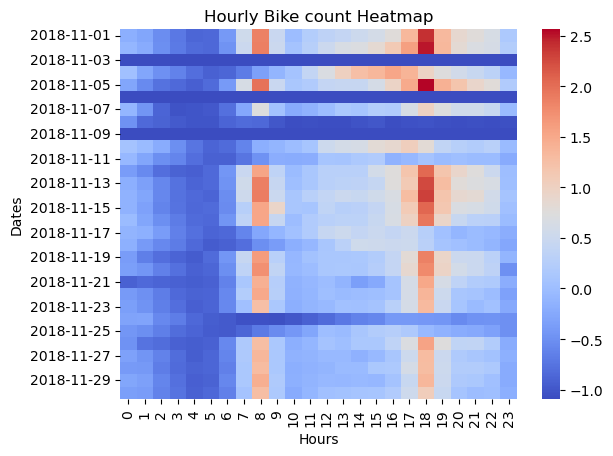

In [18]:
# On standardized 'Rented Bike Count' data - Drill down at Monthly level visualization using Heatmap



for month_yr in monthly_df['Year-Month'].unique():
    print(month_yr)
    select_dates = monthly_df[(monthly_df['Year-Month'] == month_yr)]
    print(select_dates['Date'])
    
    # Create a pivot table with Category as rows, Subcategory as columns, and Value as values
    pivot_table = select_dates.pivot_table(values = 'Rented Bike Count_standardized', index = 'Date', columns = 'Hour')
    pivot_table.index = pivot_table.index.date
    
    #pivot_table = monthly_df.pivot_table(index='Date', columns='Hour', values='Rented Bike Count', aggfunc='sum')

    sns.heatmap(pivot_table, cmap='coolwarm')
    plt.xlabel('Hours')
    plt.ylabel('Dates')
    plt.title('Hourly Bike count Heatmap')
    plt.show()

#     # Add a title and axis labels
#     plt.title('Stacked Bar Chart')
#     plt.xlabel('Date')
#     plt.ylabel('Rented Bike Count')

    # Show the plot
    plt.show()

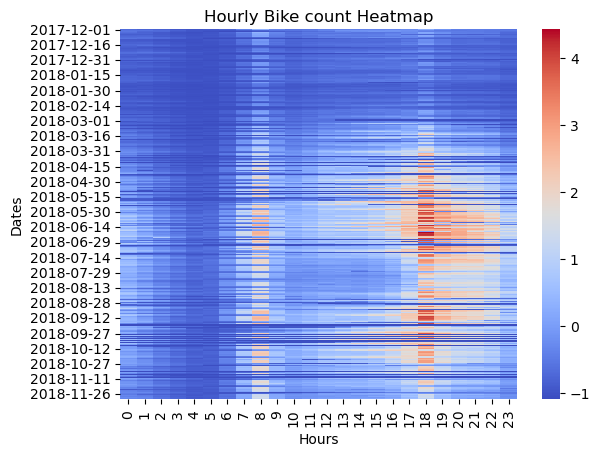

In [19]:
# Heatmap visualization on whole data - Standardized
# Create a pivot table with Category as rows, Subcategory as columns, and Value as values
pivot_table = monthly_df.pivot_table(values = 'Rented Bike Count_standardized', index = 'Date', columns = 'Hour')
pivot_table.index = pivot_table.index.date

#pivot_table = monthly_df.pivot_table(index='Date', columns='Hour', values='Rented Bike Count', aggfunc='sum')

sns.heatmap(pivot_table, cmap='coolwarm')
plt.xlabel('Hours')
plt.ylabel('Dates')
plt.title('Hourly Bike count Heatmap')
plt.show()


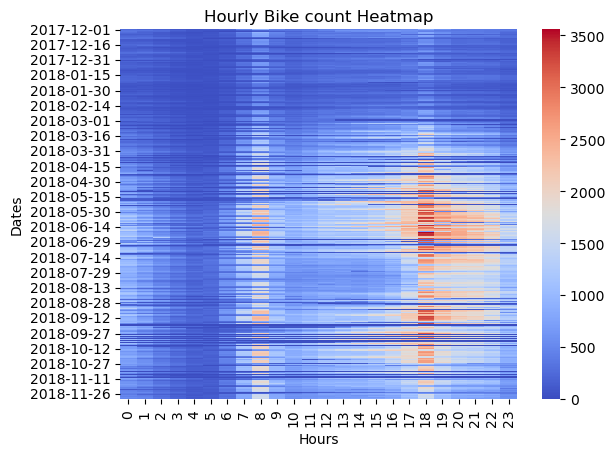

In [20]:
# Heatmap visualization on whole data - Non-Standardized
# Create a pivot table with Category as rows, Subcategory as columns, and Value as values
pivot_table = monthly_df.pivot_table(values = 'Rented Bike Count', index = 'Date', columns = 'Hour')
pivot_table.index = pivot_table.index.date

#pivot_table = monthly_df.pivot_table(index='Date', columns='Hour', values='Rented Bike Count', aggfunc='sum')

sns.heatmap(pivot_table, cmap='coolwarm')
plt.xlabel('Hours')
plt.ylabel('Dates')
plt.title('Hourly Bike count Heatmap')
plt.show()


In [21]:
monthly_df.describe()

,Hour,Rented Bike Count,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Rented Bike Count_standardized
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8.760000e+03
mean,11.500000,704.602055,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068,3.893385e-17
std,6.922582,644.997468,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746,1.000057e+00
min,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000,-1.092473e+00
25%,5.750000,191.000000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000,-7.963308e-01
50%,11.500000,504.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000,-3.102547e-01
75%,17.250000,1065.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000,5.591782e-01
max,23.000000,3556.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000,4.421042e+00


In [22]:
day_sum = monthly_df.groupby('Date').sum()
day_sum

,Hour,Rented Bike Count,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Rented Bike Count_standardized
Date,,,,,,,,,,,
2017-12-01,276,9539,-58.9,1101,36.9,44898,-325.1,5.97,0.0,0.0,-11.429301
2017-12-02,276,8523,31.8,1487,41.1,35306,-137.2,6.33,0.0,0.0,-13.004591
2017-12-03,276,7222,117.0,1957,38.7,10938,45.2,3.01,4.0,0.0,-15.021768
2017-12-04,276,8729,-7.3,1260,82.8,32708,-238.2,6.79,0.1,0.0,-12.685191
2017-12-05,276,8307,-107.0,874,26.6,47027,-418.2,0.86,0.0,0.0,-13.339495
...,...,...,...,...,...,...,...,...,...,...,...
2018-11-26,276,17162,151.7,1692,24.7,11400,20.3,10.05,0.0,2.9,0.390025
2018-11-27,276,16282,169.6,1632,32.4,9727,24.0,4.62,0.0,0.0,-0.974399
2018-11-28,276,16524,127.3,619,40.7,34298,-320.4,9.68,0.0,0.0,-0.599183


In [23]:
day_sum = monthly_df.groupby('Date').agg({'Rented Bike Count': 'sum'})
print(day_sum)



            Rented Bike Count
Date                         
2017-12-01               9539
2017-12-02               8523
2017-12-03               7222
2017-12-04               8729
2017-12-05               8307
...                       ...
2018-11-26              17162
2018-11-27              16282
2018-11-28              16524
2018-11-29              16423
2018-11-30              16297

[365 rows x 1 columns]


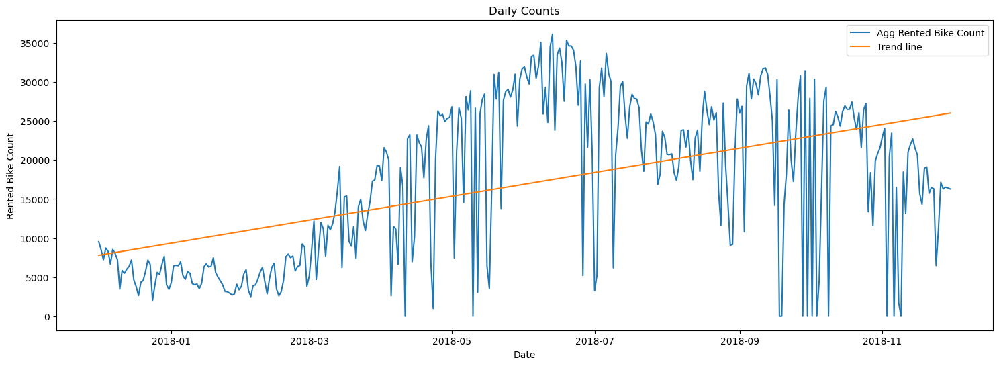

In [24]:
#import seaborn as sns

# group the data by date and sum the values
day_sum_df = monthly_df.groupby('Date')['Rented Bike Count'].sum().reset_index()

# create a new dataframe with the aggregated values and dates
day_sum_df = pd.DataFrame({'Date': day_sum_df['Date'], 'Agg Rented Bike Count': day_sum_df['Rented Bike Count']})

day_sum_df.head()
# set date as index
#day_sum_df.set_index('Date', inplace=True)

# Calculate trend line
x = np.arange(len(day_sum_df))
coefficients = np.polyfit(x, day_sum_df['Agg Rented Bike Count'], 1)
trendline = np.polyval(coefficients, x)


fig, ax = plt.subplots(figsize=(18, 6))
#fig.set_size_inches(18, 6)

# plot line chart
ax.plot(day_sum_df['Date'], day_sum_df['Agg Rented Bike Count'])

# plot trend line
ax.plot(day_sum_df['Date'], trendline)


# Add trend line using Seaborn
#sns.regplot(x=day_sum_df['Date'], y=day_sum_df['Agg Rented Bike Count'], ax=ax)


# set x-label and y-label
ax.set_xlabel('Date')
ax.set_ylabel('Rented Bike Count')

# set title
ax.set_title('Daily Counts')

ax.legend(['Agg Rented Bike Count', 'Trend line'])

# show plot
plt.show()

In [25]:
monthly_df.columns

Index(['Date', 'Hour', 'Rented Bike Count', 'Year-Month', 'Temperature(°C)',
       'Humidity(%)', 'Wind speed (m/s)', 'Visibility (10m)',
       'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)',
       'Snowfall (cm)', 'Seasons', 'Holiday', 'Functioning Day',
       'Rented Bike Count_standardized'],
      dtype='object')

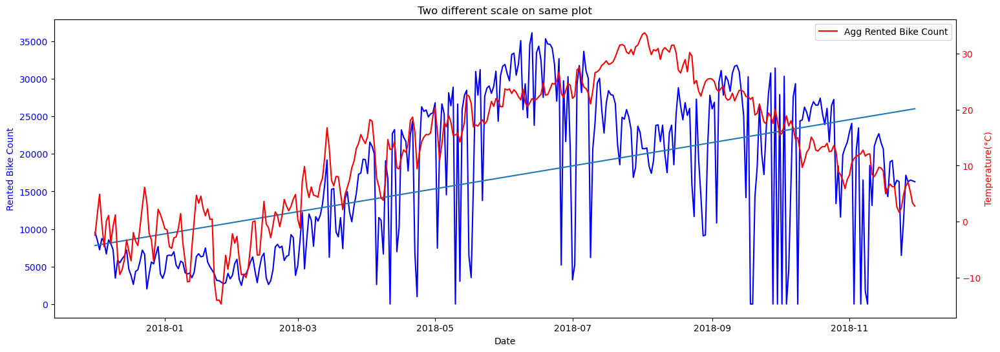

In [26]:
#import seaborn as sns

# group the data by date and sum the values
day_sum_df = monthly_df.groupby('Date')['Rented Bike Count'].sum().reset_index()
day_mean_df = monthly_df.groupby('Date')['Temperature(°C)'].mean().reset_index()

# create a new dataframe with the aggregated values and dates
day_sum_df = pd.DataFrame({'Date': day_sum_df['Date'], 
                           'Agg Rented Bike Count': day_sum_df['Rented Bike Count'],
                          'Avg Temp': day_mean_df['Temperature(°C)']})

day_sum_df.head()
# set date as index
#day_sum_df.set_index('Date', inplace=True)

# Calculate trend line
x = np.arange(len(day_sum_df))
coefficients = np.polyfit(x, day_sum_df['Agg Rented Bike Count'], 1)
trendline = np.polyval(coefficients, x)


fig, ax = plt.subplots(figsize=(18, 6))
#fig.set_size_inches(18, 6)

# plot line chart
ax.plot(day_sum_df['Date'], day_sum_df['Agg Rented Bike Count'], color='blue')

# plot trend line
ax.plot(day_sum_df['Date'], trendline)


# Add trend line using Seaborn
#sns.regplot(x=day_sum_df['Date'], y=day_sum_df['Agg Rented Bike Count'], ax=ax)


# set x-label and y-label
ax.set_xlabel('Date')
ax.set_ylabel('Rented Bike Count', color = 'blue')
ax.tick_params(axis='y', labelcolor='blue')

# create the second y-axis and plot the data on it
ax2 = ax.twinx()
ax2.plot(day_sum_df['Date'], day_mean_df['Temperature(°C)'], color='red')
ax2.set_ylabel('Temperature(°C)', color='red')
ax2.tick_params(axis='y', labelcolor='red')


# set title
plt.title('Two different scale on same plot')

plt.legend(['Agg Rented Bike Count', 'Trend line', 'Temperature(°C)'])

# show plot
plt.show()

In [27]:
monthly_df.columns

Index(['Date', 'Hour', 'Rented Bike Count', 'Year-Month', 'Temperature(°C)',
       'Humidity(%)', 'Wind speed (m/s)', 'Visibility (10m)',
       'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)',
       'Snowfall (cm)', 'Seasons', 'Holiday', 'Functioning Day',
       'Rented Bike Count_standardized'],
      dtype='object')

In [28]:
viz_cols = monthly_df[['Temperature(°C)','Humidity(%)', 'Wind speed (m/s)', 'Visibility (10m)',
      'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)']]
viz_cols

,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0
1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0
2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0
3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0
4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
8755,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0
8756,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0
8757,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0
8758,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0


In [29]:
for cols in viz_cols.columns:
    print(cols)

Temperature(°C)
Humidity(%)
Wind speed (m/s)
Visibility (10m)
Dew point temperature(°C)
Solar Radiation (MJ/m2)
Rainfall(mm)
Snowfall (cm)


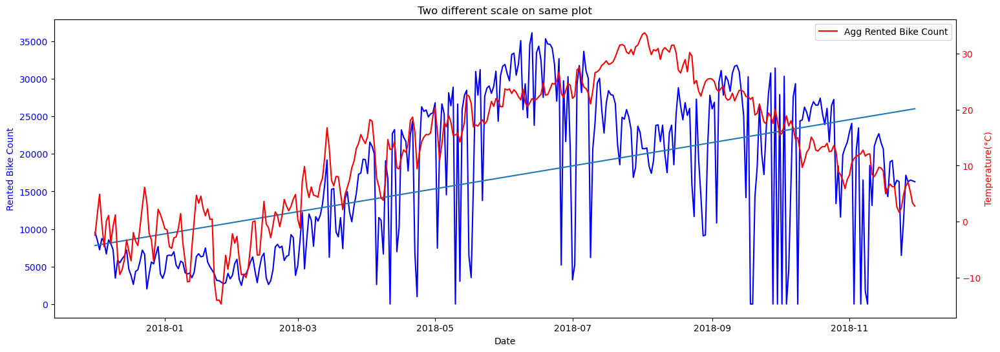

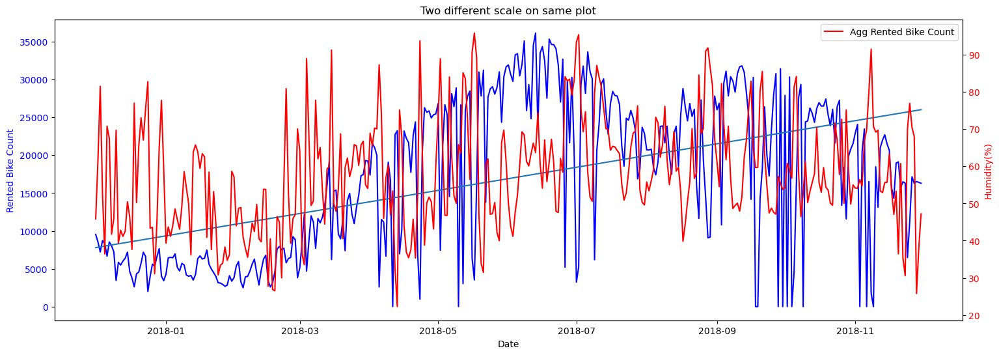

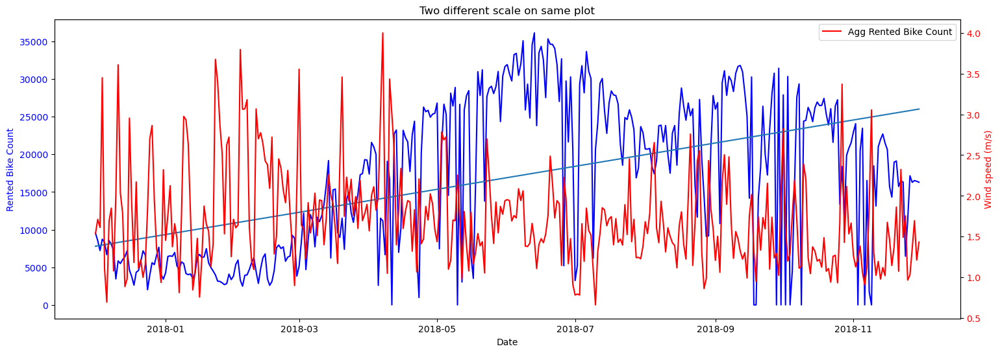

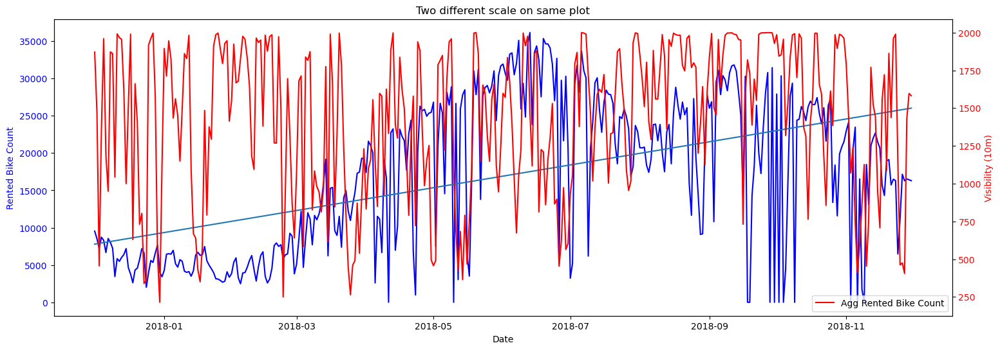

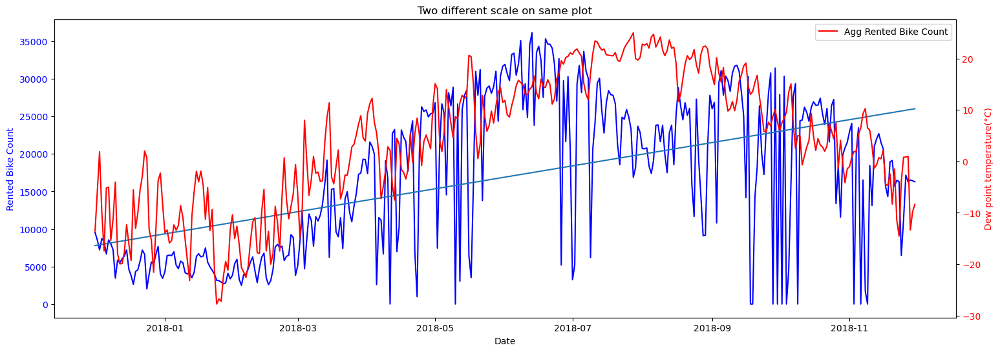

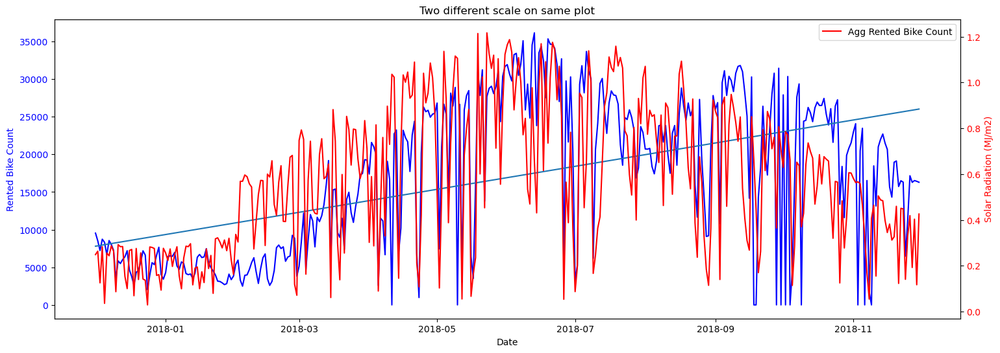

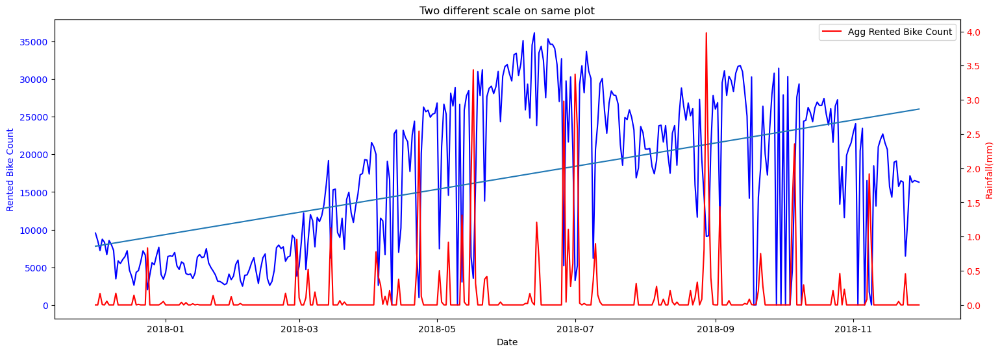

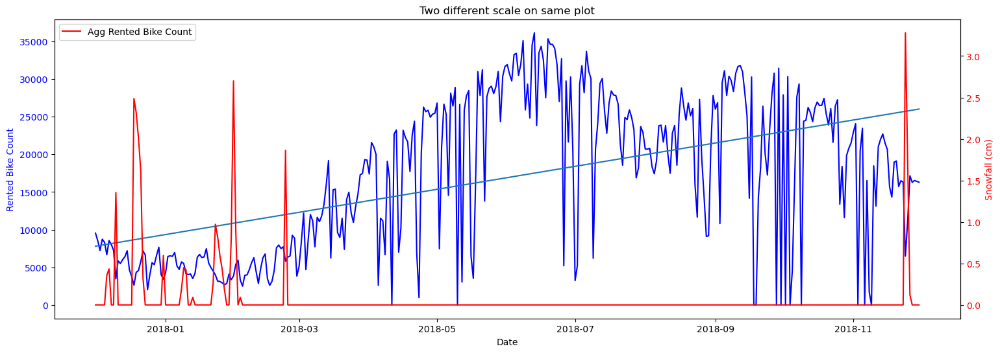

In [30]:
# Comparative visualization w columns 'Temperature(°C)','Humidity(%)', 'Wind speed (m/s)', 'Visibility (10m)',
#      'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)'

viz_cols = monthly_df[['Temperature(°C)','Humidity(%)', 'Wind speed (m/s)',
                      'Visibility (10m)','Dew point temperature(°C)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)']]

for cols in viz_cols.columns:
    # group the data by date and sum the values
    day_sum_df = monthly_df.groupby('Date')['Rented Bike Count'].sum().reset_index()
    day_mean_df = monthly_df.groupby('Date')[cols].mean().reset_index()

    # create a new dataframe with the aggregated values and dates
    day_sum_df = pd.DataFrame({'Date': day_sum_df['Date'], 
                               'Agg Rented Bike Count': day_sum_df['Rented Bike Count'],
                              'Avg Temp': day_mean_df[cols]})

    day_sum_df.head()
    # set date as index
    #day_sum_df.set_index('Date', inplace=True)

    # Calculate trend line
    x = np.arange(len(day_sum_df))
    coefficients = np.polyfit(x, day_sum_df['Agg Rented Bike Count'], 1)
    trendline = np.polyval(coefficients, x)


    fig, ax = plt.subplots(figsize=(18, 6))
    #fig.set_size_inches(18, 6)

    # plot line chart
    ax.plot(day_sum_df['Date'], day_sum_df['Agg Rented Bike Count'], color='blue')

    # plot trend line
    ax.plot(day_sum_df['Date'], trendline)


    # Add trend line using Seaborn
    #sns.regplot(x=day_sum_df['Date'], y=day_sum_df['Agg Rented Bike Count'], ax=ax)


    # set x-label and y-label
    ax.set_xlabel('Date')
    ax.set_ylabel('Rented Bike Count', color = 'blue')
    ax.tick_params(axis='y', labelcolor='blue')

    # create the second y-axis and plot the data on it
    ax2 = ax.twinx()
    ax2.plot(day_sum_df['Date'], day_mean_df[cols], color='red')
    ax2.set_ylabel(cols, color='red')
    ax2.tick_params(axis='y', labelcolor='red')


    # set title
    plt.title('Two different scale on same plot')

    plt.legend(['Agg Rented Bike Count', 'Trend line', cols])

    # show plot
    plt.show()

2017-12
0     2017-12-01
1     2017-12-01
2     2017-12-01
3     2017-12-01
4     2017-12-01
         ...    
739   2017-12-31
740   2017-12-31
741   2017-12-31
742   2017-12-31
743   2017-12-31
Name: Date, Length: 744, dtype: datetime64[ns]


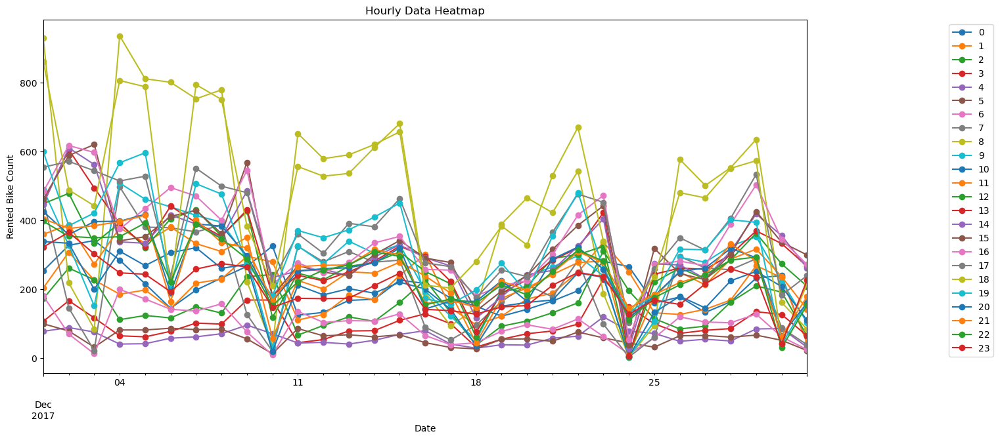

2018-1
744    2018-01-01
745    2018-01-01
746    2018-01-01
747    2018-01-01
748    2018-01-01
          ...    
1483   2018-01-31
1484   2018-01-31
1485   2018-01-31
1486   2018-01-31
1487   2018-01-31
Name: Date, Length: 744, dtype: datetime64[ns]


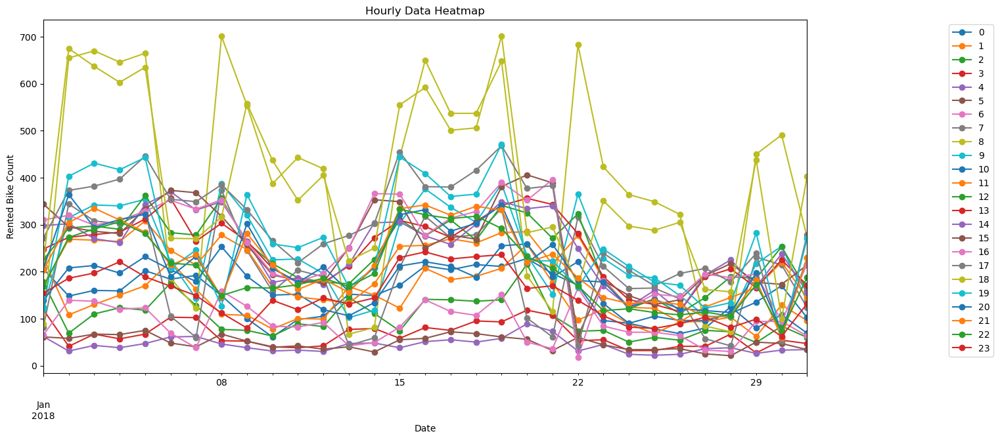

2018-2
1488   2018-02-01
1489   2018-02-01
1490   2018-02-01
1491   2018-02-01
1492   2018-02-01
          ...    
2155   2018-02-28
2156   2018-02-28
2157   2018-02-28
2158   2018-02-28
2159   2018-02-28
Name: Date, Length: 672, dtype: datetime64[ns]


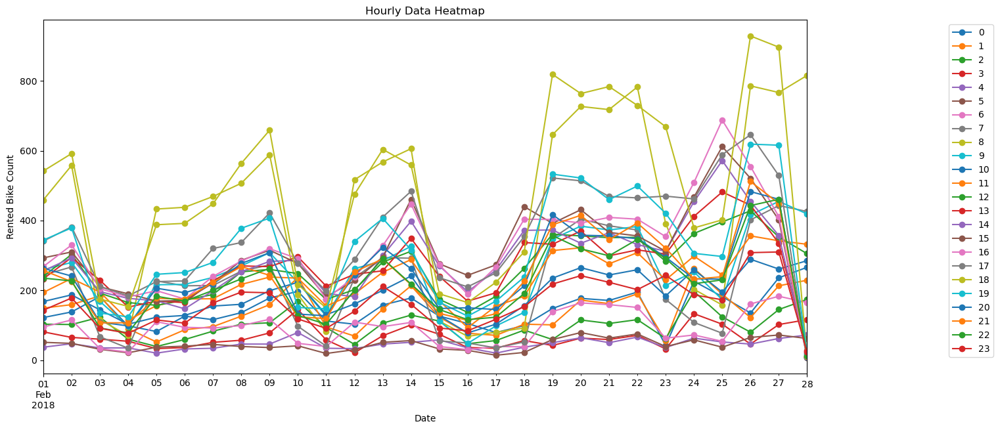

2018-3
2160   2018-03-01
2161   2018-03-01
2162   2018-03-01
2163   2018-03-01
2164   2018-03-01
          ...    
2899   2018-03-31
2900   2018-03-31
2901   2018-03-31
2902   2018-03-31
2903   2018-03-31
Name: Date, Length: 744, dtype: datetime64[ns]


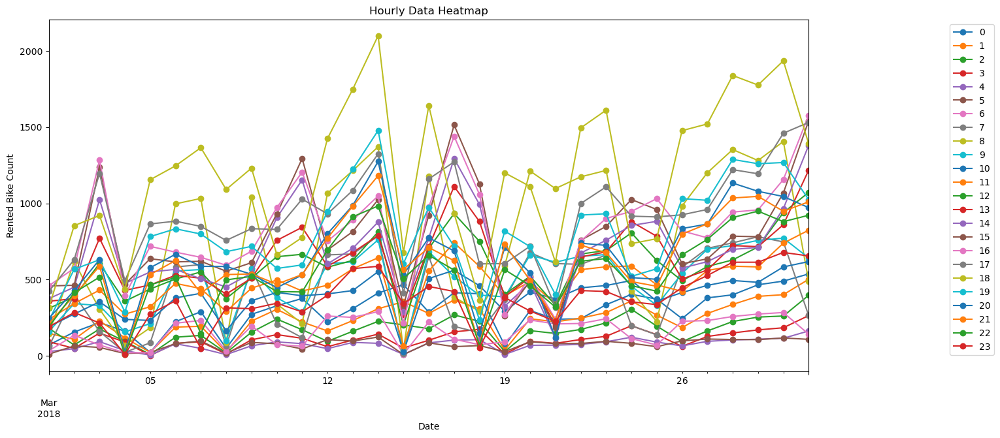

2018-4
2904   2018-04-01
2905   2018-04-01
2906   2018-04-01
2907   2018-04-01
2908   2018-04-01
          ...    
3619   2018-04-30
3620   2018-04-30
3621   2018-04-30
3622   2018-04-30
3623   2018-04-30
Name: Date, Length: 720, dtype: datetime64[ns]


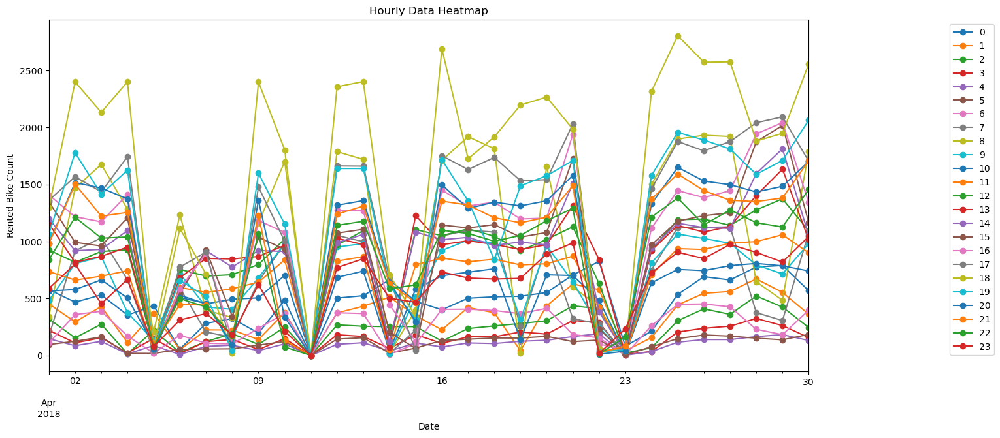

2018-5
3624   2018-05-01
3625   2018-05-01
3626   2018-05-01
3627   2018-05-01
3628   2018-05-01
          ...    
4363   2018-05-31
4364   2018-05-31
4365   2018-05-31
4366   2018-05-31
4367   2018-05-31
Name: Date, Length: 744, dtype: datetime64[ns]


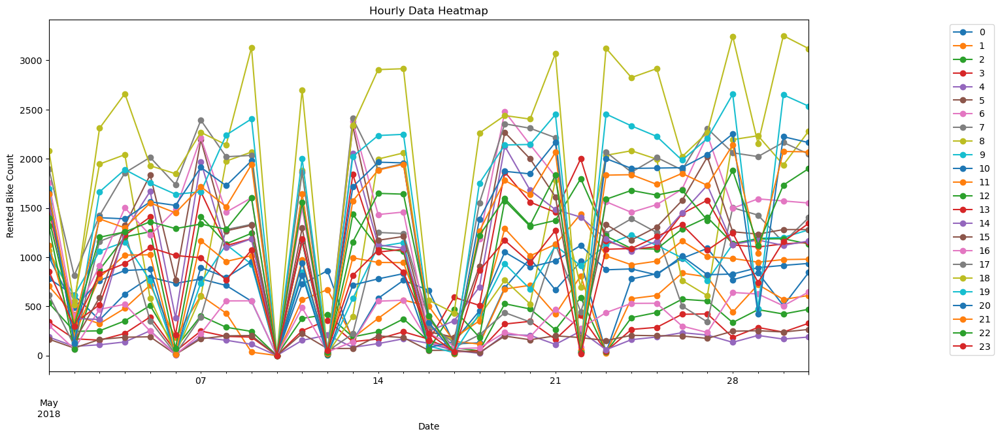

2018-6
4368   2018-06-01
4369   2018-06-01
4370   2018-06-01
4371   2018-06-01
4372   2018-06-01
          ...    
5083   2018-06-30
5084   2018-06-30
5085   2018-06-30
5086   2018-06-30
5087   2018-06-30
Name: Date, Length: 720, dtype: datetime64[ns]


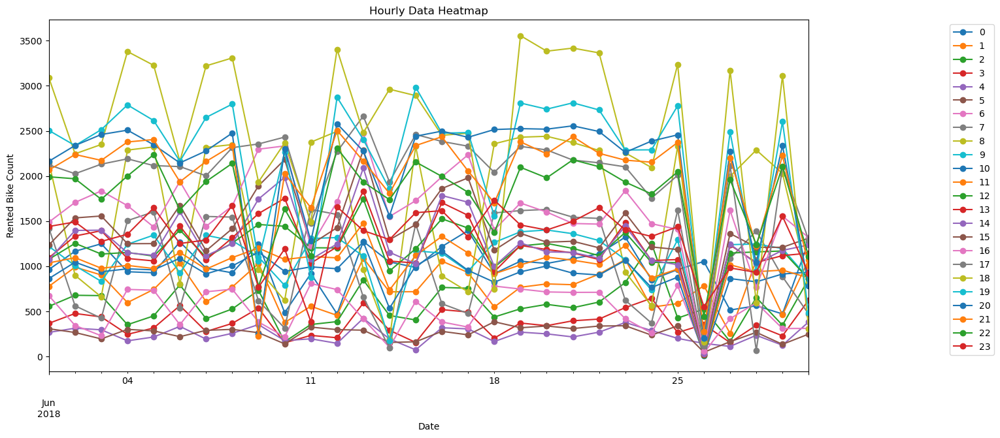

2018-7
5088   2018-07-01
5089   2018-07-01
5090   2018-07-01
5091   2018-07-01
5092   2018-07-01
          ...    
5827   2018-07-31
5828   2018-07-31
5829   2018-07-31
5830   2018-07-31
5831   2018-07-31
Name: Date, Length: 744, dtype: datetime64[ns]


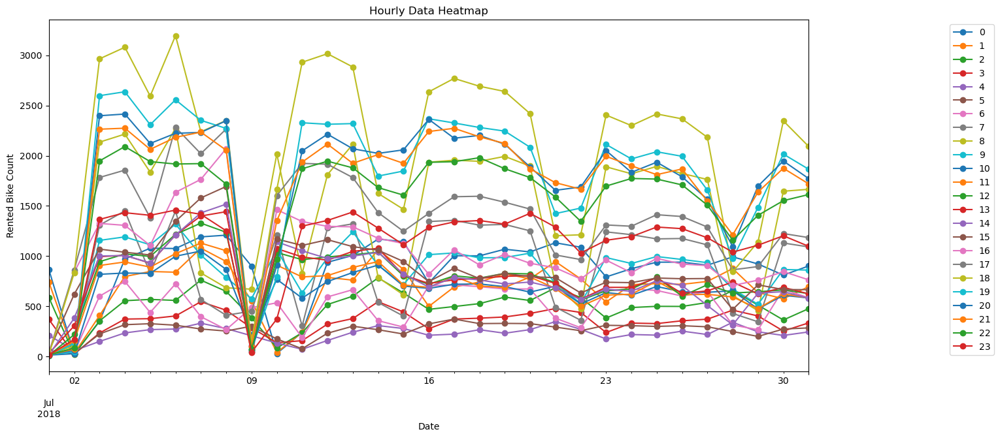

2018-8
5832   2018-08-01
5833   2018-08-01
5834   2018-08-01
5835   2018-08-01
5836   2018-08-01
          ...    
6571   2018-08-31
6572   2018-08-31
6573   2018-08-31
6574   2018-08-31
6575   2018-08-31
Name: Date, Length: 744, dtype: datetime64[ns]


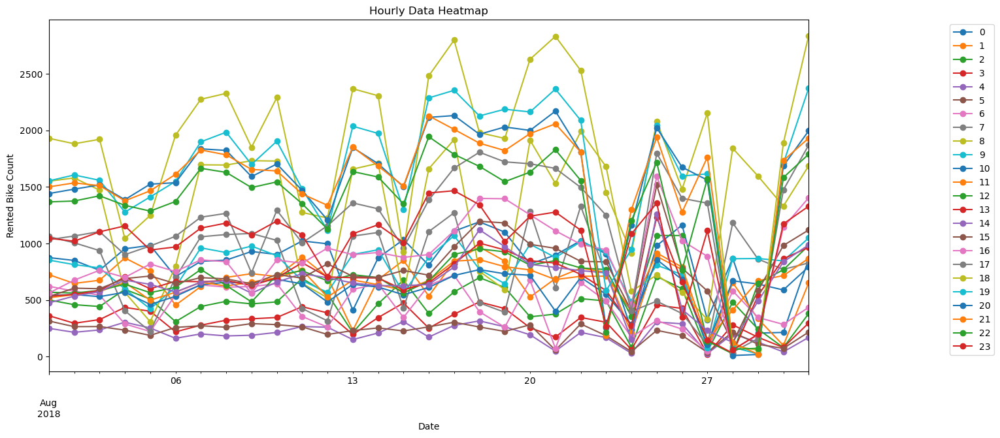

2018-9
6576   2018-09-01
6577   2018-09-01
6578   2018-09-01
6579   2018-09-01
6580   2018-09-01
          ...    
7291   2018-09-30
7292   2018-09-30
7293   2018-09-30
7294   2018-09-30
7295   2018-09-30
Name: Date, Length: 720, dtype: datetime64[ns]


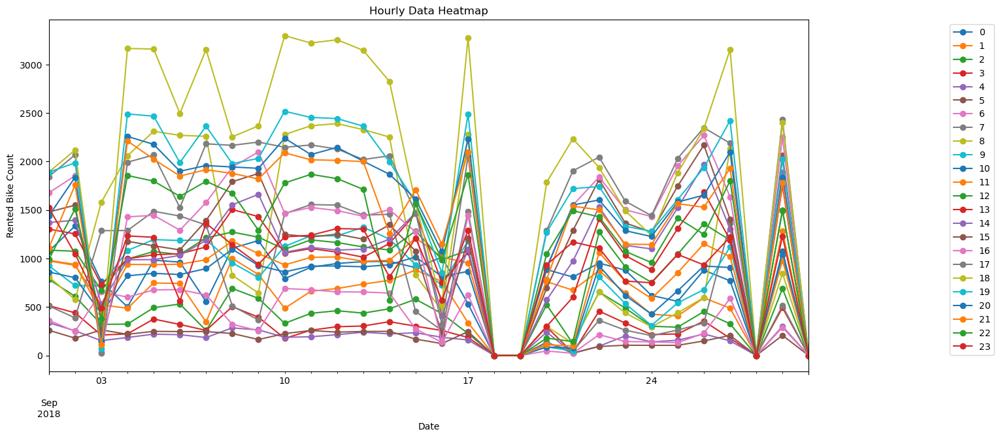

2018-10
7296   2018-10-01
7297   2018-10-01
7298   2018-10-01
7299   2018-10-01
7300   2018-10-01
          ...    
8035   2018-10-31
8036   2018-10-31
8037   2018-10-31
8038   2018-10-31
8039   2018-10-31
Name: Date, Length: 744, dtype: datetime64[ns]


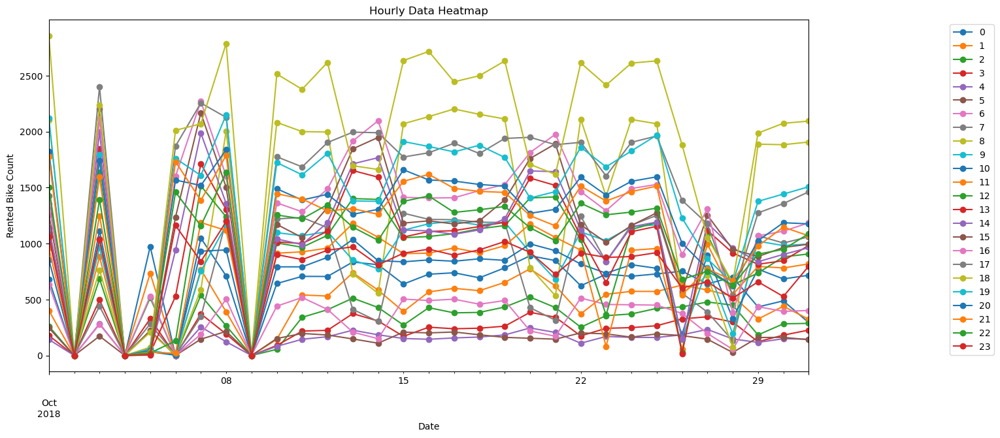

2018-11
8040   2018-11-01
8041   2018-11-01
8042   2018-11-01
8043   2018-11-01
8044   2018-11-01
          ...    
8755   2018-11-30
8756   2018-11-30
8757   2018-11-30
8758   2018-11-30
8759   2018-11-30
Name: Date, Length: 720, dtype: datetime64[ns]


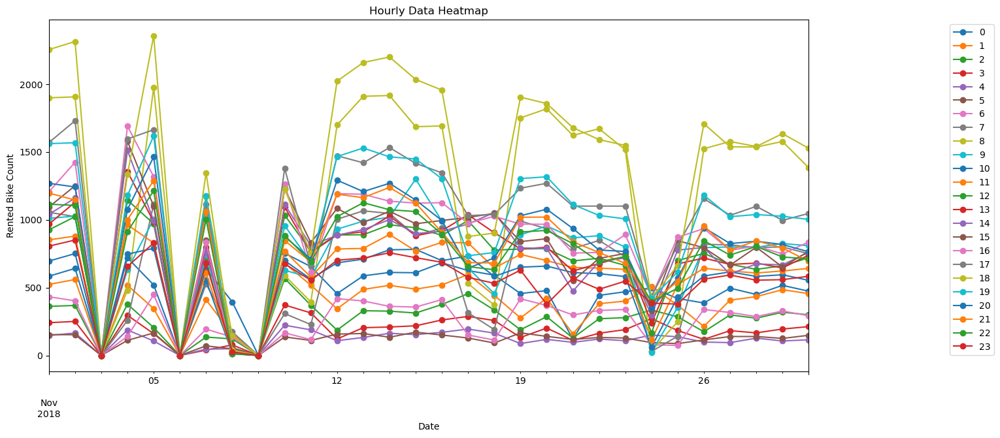

In [31]:
# Drill down at Monthly level visualization using Line chart
for month_yr in monthly_df['Year-Month'].unique():
    print(month_yr)
    select_dates = monthly_df[(monthly_df['Year-Month'] == month_yr)]
    print(select_dates['Date'])
    
    # Create a pivot table with Category as rows, Subcategory as columns, and Value as values
    pivot_table = select_dates.pivot_table(values = 'Rented Bike Count', index = 'Date', columns = 'Hour', aggfunc='sum')
    
    #pivot_table = monthly_df.pivot_table(index='Date', columns='Hour', values='Rented Bike Count', aggfunc='sum')

    # Plot pivot table as a line chart
    pivot_table.plot(kind='line', marker='o', figsize = (15, 7))
    plt.xlabel('Date')
    plt.ylabel('Rented Bike Count')
    plt.title('Hourly Data Heatmap')
    plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1))
    plt.show()

#     # Add a title and axis labels
#     plt.title('Stacked Bar Chart')
#     plt.xlabel('Date')
#     plt.ylabel('Rented Bike Count')

    # Show the plot
    plt.show()

In [32]:
# # Drill down at Monthly level visualization using Plotly
# import plotly.graph_objects as go

# for month_yr in monthly_df['Year-Month'].unique():
#     print(month_yr)
#     select_dates = monthly_df[(monthly_df['Year-Month'] == month_yr)]
#     print(select_dates['Date'])

#     # Create pivot table
#     #pivot_table = pd.pivot_table(df, values='Value', index=df['Date'].dt.day, columns=df['Date'].dt.hour, aggfunc='sum')

#     pivot_table = select_dates.pivot_table(values = 'Rented Bike Count', index = 'Date', columns = 'Hour', aggfunc='sum')

#     # Create Plotly figure
#     fig = go.Figure()

#     # Define colors
#     colors = ['hsl(' + str(h) + ',50%' + ',50%)' for h in np.linspace(0, 360, 24)]

#     # Add lines to the figure
#     for i, hour in enumerate(range(24)):
#         print("i: ", i, " hour: ", hour)
#         #print(pivot_table[hour])
#         fig.add_trace(go.Scatter(x=pivot_table.index, y=pivot_table[hour], mode='lines', line=dict(width=2, color=colors[i]), name=str(hour)))

#     # Set figure layout
#     fig.update_layout(title='Hourly Values',
#                       xaxis_title='Day of Month',
#                       yaxis_title='Rented Bike Count',
#                       xaxis=dict(dtick=1),
#                       plot_bgcolor='white',
#                       hovermode='x unified')


#     # Show the figure
#     fig.show()


In [33]:
# # Drill down at Monthly level visualization using Bokeh
# from bokeh.io import output_notebook, show
# from bokeh.plotting import figure
# from bokeh.models import ColumnDataSource
# from bokeh.models.tools import HoverTool
# from bokeh.palettes import viridis
# import pandas as pd


# for month_yr in monthly_df['Year-Month'].unique():
#     print(month_yr)
#     select_dates = monthly_df[(monthly_df['Year-Month'] == month_yr)]
#     print(select_dates['Date'])

#     # Create pivot table

#     # Create pivot table
#     #pivot_table = pd.pivot_table(df, values='Value', index=df['Date'].dt.day, columns=df['Date'].dt.hour, aggfunc='sum')

#     pivot_table = select_dates.pivot_table(values = 'Rented Bike Count', index = 'Date', columns = 'Hour', aggfunc='sum')

#     # Create Bokeh plot
#     output_notebook()

#     # Define colors
#     colors = viridis(24)

#     # Define hover tool
#     hover = HoverTool(
#         tooltips=[("Value", "@value")],
#         mode='vline'
#     )

#     # Define data source
#     source = ColumnDataSource(pivot_table)

#     # Create figure
#     p = figure(title="Hourly Values", tools=[hover], x_axis_label='Day of Month', y_axis_label='Value', x_range=list(range(1, 31)), plot_width=800, plot_height=400)

#     # Add lines to the figure
#     for i, hour in enumerate(range(24)):
#         p.line(x='Date', y=hour, source=source, line_width=2, line_color=colors[i], legend_label=str(hour))

#     # Set legend position and orientation
#     p.legend.location = 'top_left'
#     p.legend.orientation = 'horizontal'

#     # Show the plot
#     show(p)


dfBike.loc[dfBike['Date'] == '01/12/2017']

df = dfBike.loc[dfBike['Date'] == '01/12/2017']

selected_columns = ['Hour','Rented Bike Count']

df[selected_columns]

#Create Bar plot
plt.bar(df['Hour'], df['Rented Bike Count'])
plt.xlabel('Hour')
plt.ylabel('# of bike rented out')
plt.title('Bar plot')
plt.show()

**Visualization using Heat maps**

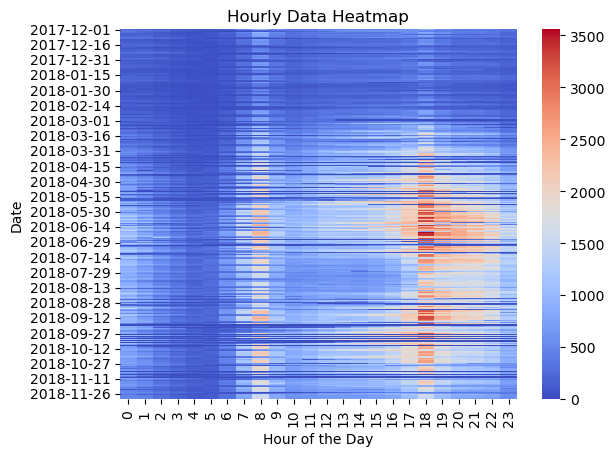

In [34]:
# Reshape the data to create a matrix with hours of the day as columns and days as rows
data_matrix = dfBike.pivot(index='Date', columns='Hour', values='Rented Bike Count')
data_matrix.index = data_matrix.index.date

# Create a heatmap using the seaborn library
sns.heatmap(data_matrix, cmap='coolwarm')
plt.xlabel('Hour of the Day')
plt.ylabel('Date')
plt.title('Hourly Data Heatmap')
plt.show()

In [35]:
# Check for Null or 0 date values
# Check for null or zero values in the 'column_name' column
null_values = dfBike['Date'].isnull().any()
zero_values = (dfBike['Date'] == 0).any()

# Print the results
if null_values:
    print('There are null values in the column')
else:
    print('There are no null values in the column')

if zero_values:
    print('There are zero values in the column')
else:
    print('There are no zero values in the column')

There are no null values in the column
There are no zero values in the column


In [36]:
# Parse the 'date_column' column into a new column with parsed dates
dfBike['DateStr'] = pd.to_datetime(dfBike['Date'], format='%d/%m/%Y')

dfBike['DateStr']

0      2017-12-01
1      2017-12-01
2      2017-12-01
3      2017-12-01
4      2017-12-01
          ...    
8755   2018-11-30
8756   2018-11-30
8757   2018-11-30
8758   2018-11-30
8759   2018-11-30
Name: DateStr, Length: 8760, dtype: datetime64[ns]

# Create a Loop to iterate through Months & Years
Months = ['1','2','3','4','5','6','7','8','9','10','11','12']
Years = ['2017', '2018']

for Year in Years:
    for Month in Months:
        print(Month,"-", Year,"\n")
    

Months


for Year in Years:
    for Month in Months:
        print("For ", Month,"-", Year)
        m = int(Month)
        y = int(Year)
        
        #print(type(m)," ", type(y))
        #print(dfBike[dfBike['DateStr'].dt.month])
         
        #if (dfBike['DateStr'].dt.month isequal m):
        selected_dates = dfBike[(dfBike['DateStr'].dt.month == m) &
                                 (dfBike['DateStr'].dt.year == y)]
        if selected_dates['Date'].notna().any():
            #print("\n",selected_dates['Date'])
            # Reshape the data to create a matrix with hours of the day as columns and days as rows
            data_matrix = selected_dates.pivot(index='Date', columns='Hour', values='Rented Bike Count')
            # Create a heatmap using the seaborn library
            sns.heatmap(data_matrix, cmap='coolwarm')
            plt.xlabel('Hour of the Day')
            plt.ylabel('Date')
            plt.title('Hourly Data Heatmap')
            plt.show()
        else:
            print("Skip..")


In [37]:
# Alternate methods to get column information
print(dfBike.dtypes)
print("\n")
print(dfBike.info())

Date                         datetime64[ns]
Rented Bike Count                     int64
Hour                                  int64
Temperature(°C)                     float64
Humidity(%)                           int64
Wind speed (m/s)                    float64
Visibility (10m)                      int64
Dew point temperature(°C)           float64
Solar Radiation (MJ/m2)             float64
Rainfall(mm)                        float64
Snowfall (cm)                       float64
Seasons                              object
Holiday                              object
Functioning Day                      object
Month                                 int64
Year                                  int64
Year-Month                           object
DateStr                      datetime64[ns]
dtype: object


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------           

In [38]:
# Alt 1: Check month-wise distribution of "Rented bike counts" 

# Convert the date column to datetime
dfBike['Date'] = pd.to_datetime(dfBike['Date'], format='%d/%m/%Y')

# Extract the month from the date
dfBike['Month'] = dfBike['Date'].dt.month
dfBike['Year'] = dfBike['Date'].dt.year

#dfBike['Month']

# Group the data by month and calculate mean and standard deviation
monthly_stats = dfBike.groupby(['Month', 'Year']).agg({'Rented Bike Count': ['mean', 'std']})

print(monthly_stats)

           Rented Bike Count            
                        mean         std
Month Year                              
1     2018        201.620968  127.180889
2     2018        225.941964  160.665033
3     2018        511.551075  377.850544
4     2018        728.093056  598.379605
5     2018        950.387097  749.465355
6     2018       1245.676389  769.050023
7     2018        987.177419  666.348030
8     2018        876.192204  572.975581
9     2018        935.572222  745.310358
10    2018        874.563172  661.048202
11    2018        646.826389  483.240662
12    2017        249.099462  158.396544


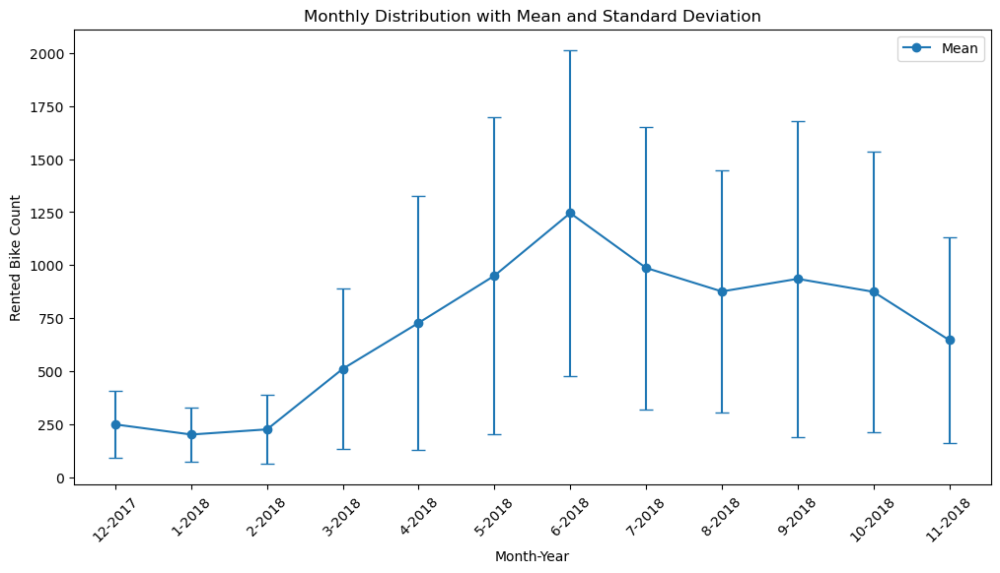

In [39]:
# Alt 2: Check month-wise distribution of "Rented bike counts" 

# Convert the date column to datetime
dfBike['Date'] = pd.to_datetime(dfBike['Date'], format='%d/%m/%Y')

# Extract the month from the date
dfBike['Month'] = dfBike['Date'].dt.month
dfBike['Year'] = dfBike['Date'].dt.year

#dfBike['Month']

# Group the data by month and calculate mean and standard deviation
monthly_stats = dfBike.groupby(['Month', 'Year']).agg({'Rented Bike Count': ['mean', 'std']}).sort_values(['Year', 'Month'])

# Reset the index to make the grouped columns regular columns
monthly_stats = monthly_stats.reset_index()

# Plotting the monthly distribution and mean with error bars
fig, ax = plt.subplots()
fig.set_size_inches(12, 6)

# Plot the mean values as a line
ax.plot(monthly_stats.index, monthly_stats['Rented Bike Count']['mean'], marker='o', label='Mean')

# Plot the error bars using standard deviation
ax.errorbar(monthly_stats.index, monthly_stats['Rented Bike Count']['mean'], 
            yerr=monthly_stats['Rented Bike Count']['std'], fmt='none', capsize=5)

# Customize the plot
ax.set_xticks(monthly_stats.index)
ax.set_xticklabels(monthly_stats['Month'].astype(str) + '-' + monthly_stats['Year'].astype(str), rotation=45)
ax.set_xlabel('Month-Year')
ax.set_ylabel('Rented Bike Count')
ax.set_title('Monthly Distribution with Mean and Standard Deviation')
ax.legend()

plt.show()

# Plot the monthly distribution, mean, and standard deviation
#fig, ax = plt.subplots()
#ax.bar(monthly_stats.index, monthly_stats['Rented Bike Count']['mean'], yerr=monthly_stats['Rented Bike Count']['std'])
#ax.set_xlabel('Month-Year')
#ax.set_ylabel('Rented Bike Count')
#ax.set_title('Month-wise Distribution')
#plt.show()


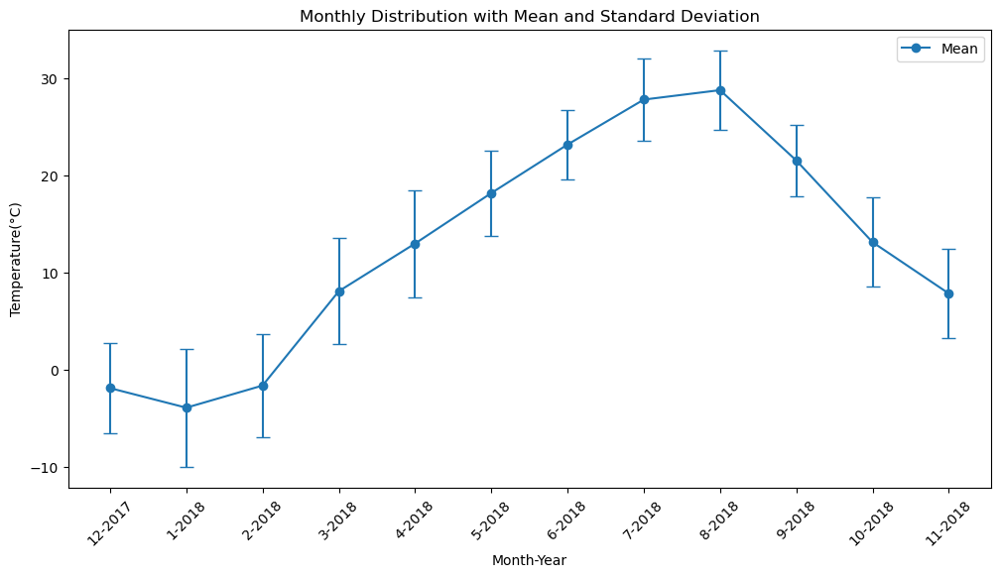

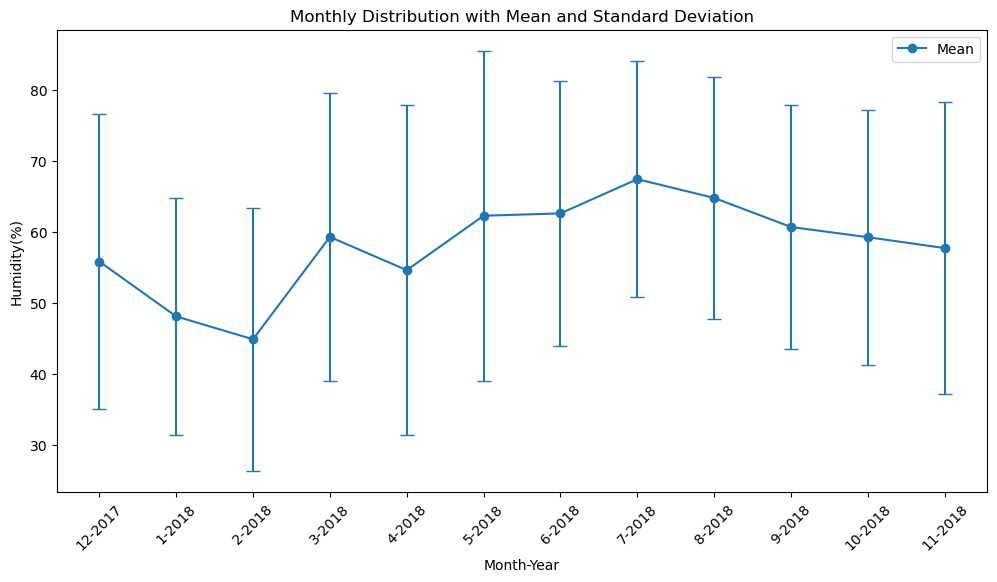

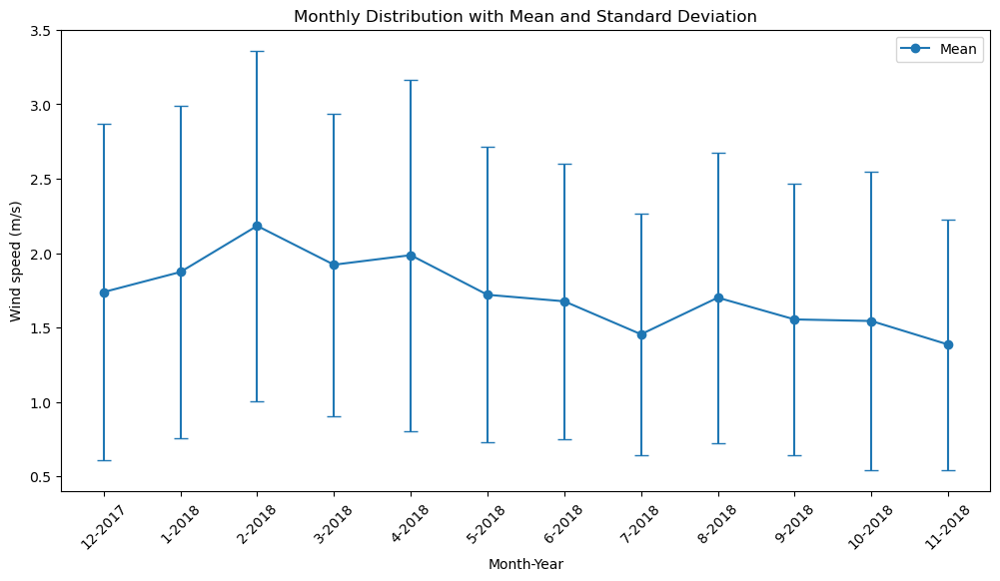

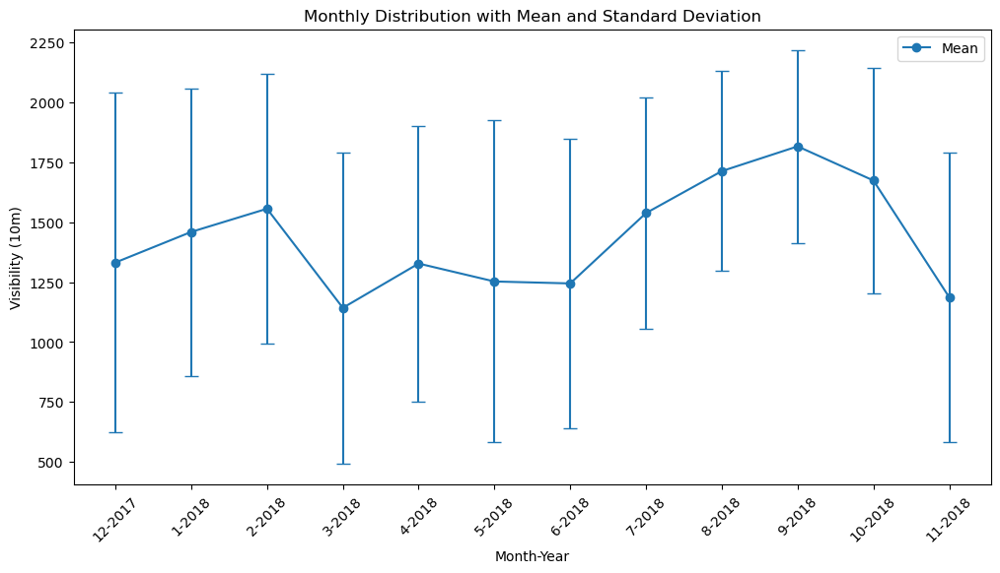

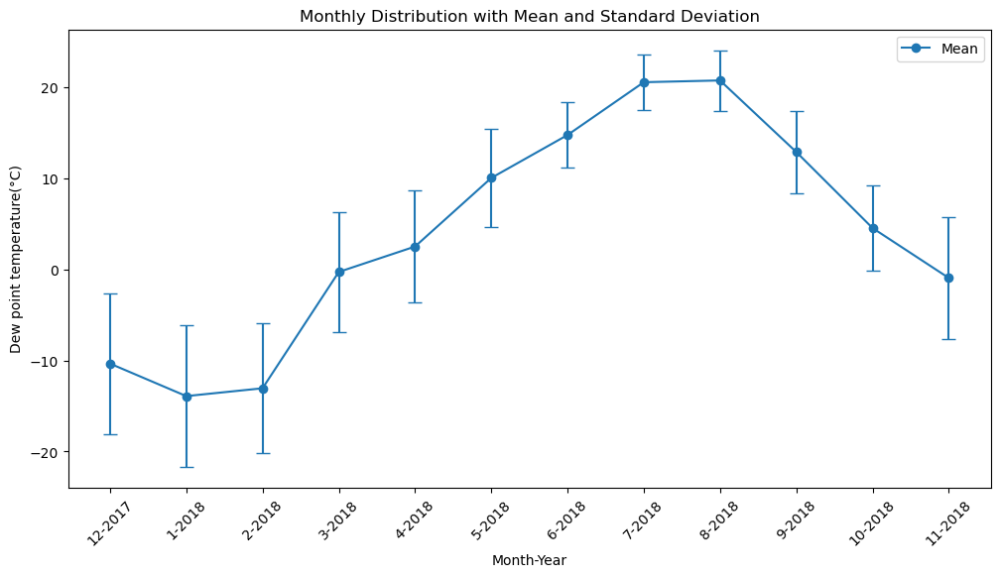

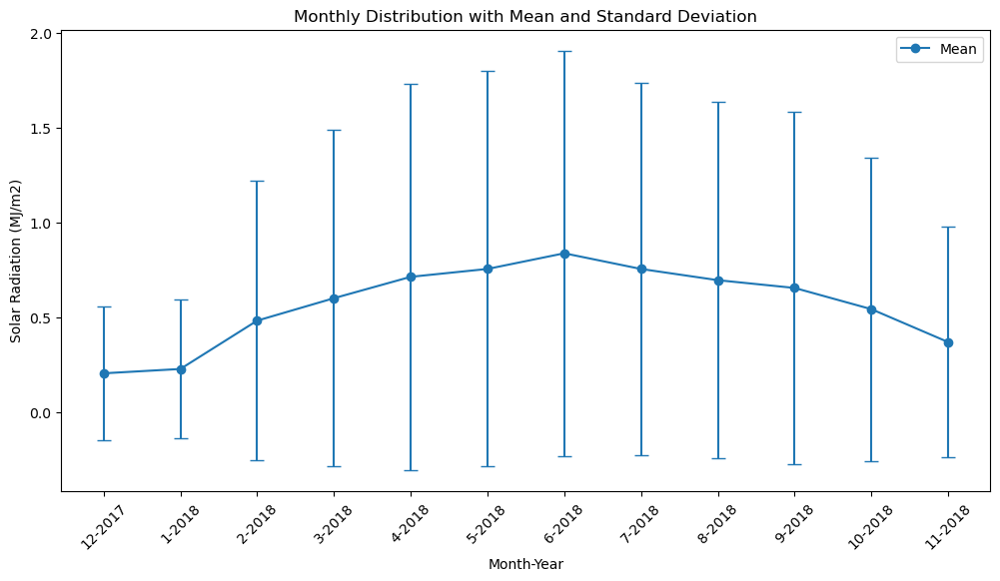

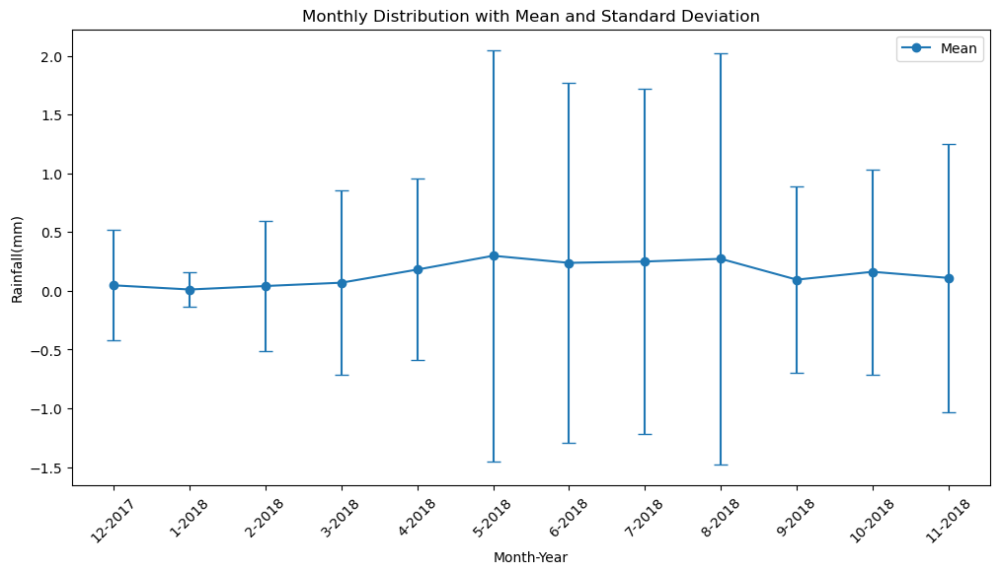

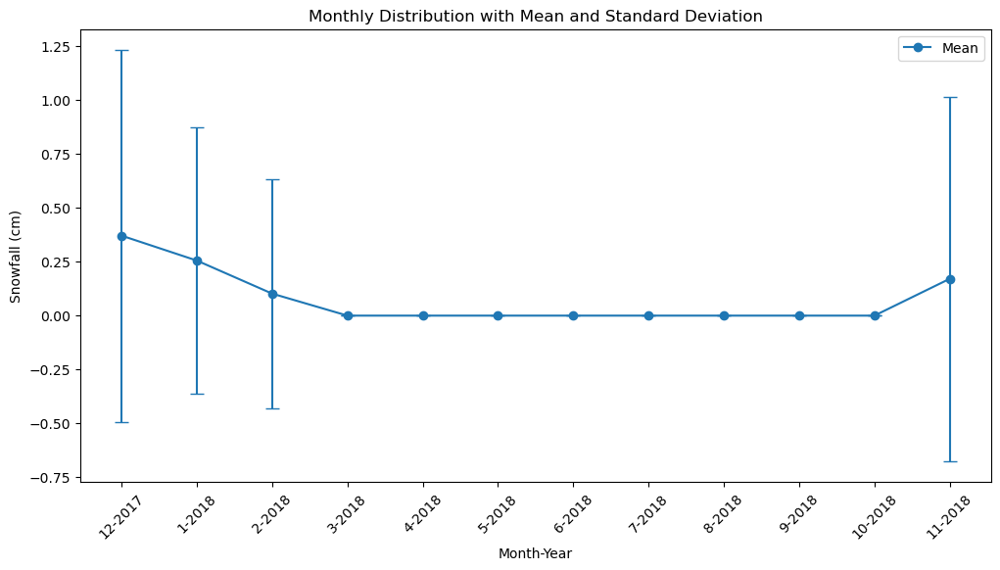

In [40]:
# Alt 3: Check month-wise distribution of "Rented bike counts" 

# Convert the date column to datetime
dfBike['Date'] = pd.to_datetime(dfBike['Date'], format='%d/%m/%Y')

# Extract the month from the date
dfBike['Month'] = dfBike['Date'].dt.month
dfBike['Year'] = dfBike['Date'].dt.year

analysis_cols = ['Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)']
#dfBike['Month']


    
  
for col in analysis_cols:
    
    # Group the data by month and calculate mean and standard deviation
    monthly_stats = dfBike.groupby(['Month', 'Year']).agg({col: ['mean', 'std']}).sort_values(['Year', 'Month'])
    # Reset the index to make the grouped columns regular columns
    monthly_stats = monthly_stats.reset_index()
  
    # Plotting the monthly distribution and mean with error bars
    fig, ax = plt.subplots()
    fig.set_size_inches(12, 6)
    
    # Plot the mean values as a line
    ax.plot(monthly_stats.index, monthly_stats[col]['mean'], marker='o', label='Mean')

    # Plot the error bars using standard deviation
    ax.errorbar(monthly_stats.index, monthly_stats[col]['mean'], 
                    yerr=monthly_stats[col]['std'], fmt='none', capsize=5)

    # Customize the plot
    ax.set_xticks(monthly_stats.index)
    ax.set_xticklabels(monthly_stats['Month'].astype(str) + '-' + monthly_stats['Year'].astype(str), rotation=45)
    ax.set_xlabel('Month-Year')
    ax.set_ylabel(col)
    ax.set_title('Monthly Distribution with Mean and Standard Deviation')
    ax.legend()
    plt.show()





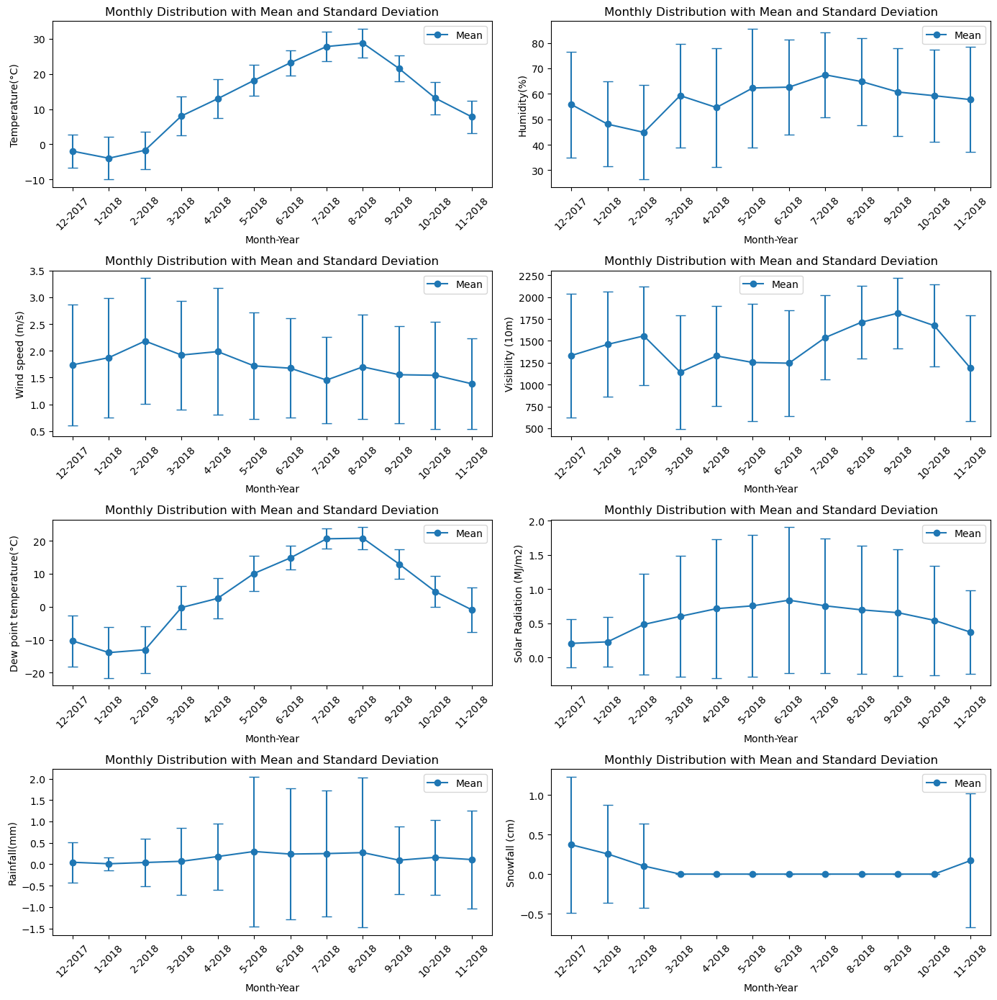

In [41]:
# Alt 3:  Check month-wise distribution of "Rented bike counts" 
# Convert the date column to datetime
dfBike['Date'] = pd.to_datetime(dfBike['Date'], format='%d/%m/%Y')

# Extract the month from the date
dfBike['Month'] = dfBike['Date'].dt.month
dfBike['Year'] = dfBike['Date'].dt.year

analysis_cols = ['Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)']

# Setting column counter of analysis_cols
col=0

# Plotting the monthly distribution and mean with error bars
fig, ax = plt.subplots(nrows=4, ncols=2)
fig.set_size_inches(14, 14)

# for 4x2 matrix layout, where r is row & c is column
for r in range(4):
    for c in range(2):
        #print(r, " ",c)
        #print(analysis_cols[col])
        
        # Group the data by month and calculate mean and standard deviation
        monthly_stats = dfBike.groupby(['Month', 'Year']).agg({analysis_cols[col]: ['mean', 'std']}).sort_values(['Year', 'Month'])
        # Reset the index to make the grouped columns regular columns
        monthly_stats = monthly_stats.reset_index()

        
        
        # Plot the mean values as a line
        ax[r, c].plot(monthly_stats.index, monthly_stats[analysis_cols[col]]['mean'], marker='o', label='Mean')

        # Plot the error bars using standard deviation
        ax[r, c].errorbar(monthly_stats.index, monthly_stats[analysis_cols[col]]['mean'], 
                        yerr=monthly_stats[analysis_cols[col]]['std'], fmt='none', capsize=5)

        # Customize the plot
        ax[r, c].set_xticks(monthly_stats.index)
        ax[r, c].set_xticklabels(monthly_stats['Month'].astype(str) + '-' + monthly_stats['Year'].astype(str), rotation=45)
        ax[r, c].set_xlabel('Month-Year')
        ax[r, c].set_ylabel(analysis_cols[col])
        ax[r, c].set_title('Monthly Distribution with Mean and Standard Deviation')
        ax[r, c].legend()
        
        col=col+1
        
# Adjust spacing between subplots
plt.tight_layout()

plt.show()


# Check month-wise distribution of "Rented bike counts" 
for Year in Years:
    for Month in Months:
        print("For ", Month,"-", Year)
        m = int(Month)
        y = int(Year)
        
        #print(type(m)," ", type(y))
        #print(dfBike[dfBike['DateStr'].dt.month])
         
        #if (dfBike['DateStr'].dt.month isequal m):
        selected_dates = dfBike[(dfBike['DateStr'].dt.month == m) &
                                 (dfBike['DateStr'].dt.year == y)]
        if selected_dates['Date'].notna().any():
            #print("\n",selected_dates['Date'])
            # Reshape the data to create a matrix with hours of the day as columns and days as rows
            data_matrix = selected_dates.pivot(index='Date', columns='Hour', values='Rented Bike Count')
            data_matrix.index = data_matrix.index.date
            
            # Create a heatmap using the seaborn library
            sns.heatmap(data_matrix, cmap='coolwarm')
            plt.xlabel('Hour of the Day')
            plt.ylabel('Date')
            plt.title('Hourly Data Heatmap')
            plt.show()
        else:
            print("Skip..")

**Analysis of other columns**

In [42]:
dfBike.columns

Index(['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day', 'Month', 'Year', 'Year-Month', 'DateStr'],
      dtype='object')

In [43]:
selected_columns = ['Seasons','Holiday', 'Functioning Day']
for col in selected_columns:
    #print("Selected column: ", col)
    unique_values = dfBike[col].unique()
    print(f"Unique values in column {col}: {unique_values}")

Unique values in column Seasons: ['Winter' 'Spring' 'Summer' 'Autumn']
Unique values in column Holiday: ['No Holiday' 'Holiday']
Unique values in column Functioning Day: ['Yes' 'No']


In [44]:
# Building correlation matrix
selected_columns = ['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day']
correlation_matrix = dfBike[selected_columns].corr()
print(correlation_matrix)

                           Rented Bike Count      Hour  Temperature(°C)  \
Rented Bike Count                   1.000000  0.410257         0.538558   
Hour                                0.410257  1.000000         0.124114   
Temperature(°C)                     0.538558  0.124114         1.000000   
Humidity(%)                        -0.199780 -0.241644         0.159371   
Wind speed (m/s)                    0.121108  0.285197        -0.036252   
Visibility (10m)                    0.199280  0.098753         0.034794   
Dew point temperature(°C)           0.379788  0.003054         0.912798   
Solar Radiation (MJ/m2)             0.261837  0.145131         0.353505   
Rainfall(mm)                       -0.123074  0.008715         0.050282   
Snowfall (cm)                      -0.141804 -0.021516        -0.218405   

                           Humidity(%)  Wind speed (m/s)  Visibility (10m)  \
Rented Bike Count            -0.199780          0.121108          0.199280   
Hour              

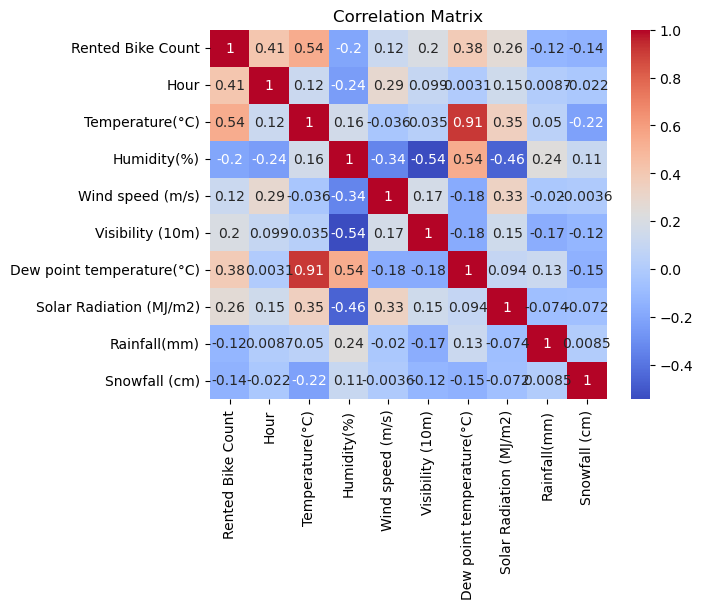

In [45]:
# Method 1
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.savefig('/kaggle/working/image_export1.png')
plt.show()

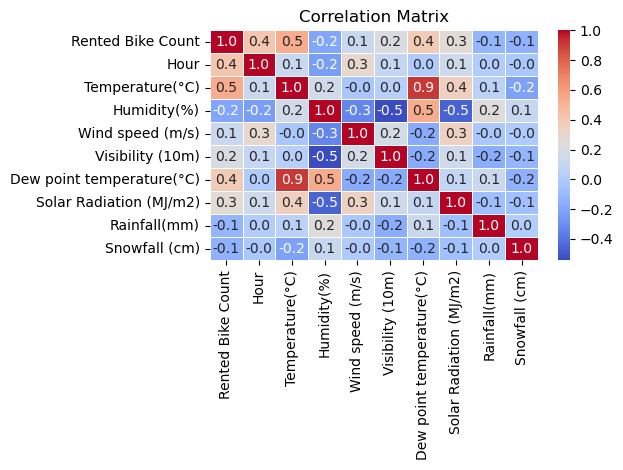

In [46]:
# Method 2

import matplotlib.pyplot as plt
import seaborn as sns
# create a heatmap using seaborn
sns.heatmap(correlation_matrix, annot = True, cmap='coolwarm', fmt='.1f', linewidths = 0.5)

# set plot title
plt.title('Correlation Matrix')

# set the size of the figure
#plt.figure(figsize=(10,8))

# set the DPI of the figure
plt.rcParams['savefig.dpi'] = 300

plt.tight_layout()
# save the figure to a file
plt.savefig('/kaggle/working/custom_image_export.png')


**Perform encoding transformations**

For columns: 'Seasons', 'Holiday', 'Functioning Day'

In [47]:
from sklearn.preprocessing import OneHotEncoder

# one-hot encode the categorical variable
encoder = OneHotEncoder(sparse=False)
encoded_seasons = encoder.fit_transform(dfBike[['Hour','Seasons', 'Holiday', 'Functioning Day']])

# concatenate the one-hot encoded variable with the numerical variables
X = pd.concat([dfBike[['Date', 'Rented Bike Count', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)']], pd.DataFrame(encoded_seasons, columns=encoder.get_feature_names())], axis=1)
print(X)

           Date  Rented Bike Count  Temperature(°C)  Humidity(%)  \
0    2017-12-01                254             -5.2           37   
1    2017-12-01                204             -5.5           38   
2    2017-12-01                173             -6.0           39   
3    2017-12-01                107             -6.2           40   
4    2017-12-01                 78             -6.0           36   
...         ...                ...              ...          ...   
8755 2018-11-30               1003              4.2           34   
8756 2018-11-30                764              3.4           37   
8757 2018-11-30                694              2.6           39   
8758 2018-11-30                712              2.1           41   
8759 2018-11-30                584              1.9           43   

      Wind speed (m/s)  Visibility (10m)  Dew point temperature(°C)  \
0                  2.2              2000                      -17.6   
1                  0.8              2000 

/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [48]:
X.columns

# Extract date
X['Year'] = pd.to_datetime(X['Date']).dt.year
X['Month'] = pd.to_datetime(X['Date']).dt.month
X['Day'] = pd.to_datetime(X['Date']).dt.day

X.head()

,Date,Rented Bike Count,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),...,x1_Spring,x1_Summer,x1_Winter,x2_Holiday,x2_No Holiday,x3_No,x3_Yes,Year,Month,Day
0,2017-12-01,254,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2017,12,1
1,2017-12-01,204,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2017,12,1
2,2017-12-01,173,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2017,12,1
3,2017-12-01,107,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2017,12,1
4,2017-12-01,78,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2017,12,1


In [49]:
# Split data into train & test data
from sklearn.model_selection import train_test_split
X_df = X[['Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'x0_0',
       'x0_1', 'x0_2', 'x0_3', 'x0_4', 'x0_5', 'x0_6', 'x0_7', 'x0_8', 'x0_9',
       'x0_10', 'x0_11', 'x0_12', 'x0_13', 'x0_14', 'x0_15', 'x0_16', 'x0_17',
       'x0_18', 'x0_19', 'x0_20', 'x0_21', 'x0_22', 'x0_23', 'x1_Autumn',
       'x1_Spring', 'x1_Summer', 'x1_Winter', 'x2_Holiday', 'x2_No Holiday',
       'x3_No', 'x3_Yes', 'Year', 'Month', 'Day']]
y_df = X['Rented Bike Count']

X_train, X_test, y_train, y_test = train_test_split(X_df, y_df, test_size=0.2, random_state=42)

In [50]:
# Create DataFrames from NumPy arrays with column names
columns = ['Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'x0_0',
       'x0_1', 'x0_2', 'x0_3', 'x0_4', 'x0_5', 'x0_6', 'x0_7', 'x0_8', 'x0_9',
       'x0_10', 'x0_11', 'x0_12', 'x0_13', 'x0_14', 'x0_15', 'x0_16', 'x0_17',
       'x0_18', 'x0_19', 'x0_20', 'x0_21', 'x0_22', 'x0_23', 'x1_Autumn',
       'x1_Spring', 'x1_Summer', 'x1_Winter', 'x2_Holiday', 'x2_No Holiday',
       'x3_No', 'x3_Yes', 'Year', 'Month', 'Day']
X_train_df = pd.DataFrame(X_train, columns=columns)
X_test_df = pd.DataFrame(X_test, columns=columns)
y_train_df = pd.DataFrame(y_train, columns=['Rented Bike Count'])
y_test_df = pd.DataFrame(y_test, columns=['Rented Bike Count'])

In [51]:
X_train_df

,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),x0_0,x0_1,...,x1_Spring,x1_Summer,x1_Winter,x2_Holiday,x2_No Holiday,x3_No,x3_Yes,Year,Month,Day
8415,13.2,61,3.9,719,5.8,1.03,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,2018,11,16
5049,22.9,86,1.7,538,20.4,0.76,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,1.0,2018,6,29
8395,11.2,46,1.4,869,0.0,0.00,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,2018,11,15
1535,-2.6,69,2.0,1434,-7.5,0.00,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2018,2,2
5518,27.2,73,1.5,1005,21.9,0.00,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,1.0,2018,7,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5734,29.9,74,2.0,1201,24.7,0.00,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,1.0,2018,7,27
5191,23.5,90,0.5,445,21.7,0.05,0.5,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,1.0,2018,7,5
5390,29.5,62,2.7,1941,21.4,1.79,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,1.0,2018,7,13
860,-3.4,51,1.1,1391,-12.1,0.00,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2018,1,5


In [52]:
print(X_train.columns, "\n", y_train, "\n", "X_train: ", X_train.shape,
     "X_test: ", X_test.shape, "\n", "y_train: ", y_train.shape,
     "y_test: ", y_test.shape)

Index(['Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
       'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'x0_0',
       'x0_1', 'x0_2', 'x0_3', 'x0_4', 'x0_5', 'x0_6', 'x0_7', 'x0_8', 'x0_9',
       'x0_10', 'x0_11', 'x0_12', 'x0_13', 'x0_14', 'x0_15', 'x0_16', 'x0_17',
       'x0_18', 'x0_19', 'x0_20', 'x0_21', 'x0_22', 'x0_23', 'x1_Autumn',
       'x1_Spring', 'x1_Summer', 'x1_Winter', 'x2_Holiday', 'x2_No Holiday',
       'x3_No', 'x3_Yes', 'Year', 'Month', 'Day'],
      dtype='object') 
 8415     995
5049    1195
8395    1448
1535     178
5518    1980
        ... 
5734    1507
5191     828
5390     999
860      322
7270    1501
Name: Rented Bike Count, Length: 7008, dtype: int64 
 X_train:  (7008, 43) X_test:  (1752, 43) 
 y_train:  (7008,) y_test:  (1752,)


In [53]:
# Apply Z standard transformation
from sklearn.preprocessing import StandardScaler

# Create an instance of the StandardScaler class
scaler = StandardScaler()

X_train_df = scaler.fit_transform(X_train_df)
X_test_df = scaler.transform(X_test_df)

print("X_train: ", X_train_df, "\n X_test: ", X_test_df )

X_train:  [[ 0.02237011  0.13701177  2.09293986 ...  0.30179287  1.30209798
   0.03124038]
 [ 0.83822207  1.35998213 -0.02968279 ...  0.30179287 -0.15011137
   1.50821158]
 [-0.14584679 -0.59677044 -0.31913134 ...  0.30179287  1.30209798
  -0.08237279]
 ...
 [ 1.39333784  0.18593058  0.93514568 ...  0.30179287  0.1403305
  -0.30959913]
 [-1.37383015 -0.35217637 -0.60857988 ...  0.30179287 -1.60232071
  -1.21850448]
 [ 0.53543165 -0.15650112 -1.18747697 ...  0.30179287  0.72121424
   1.50821158]] 
 X_test:  [[ 1.1998884   0.52836228  0.06680005 ...  0.30179287  0.43077237
  -0.65043864]
 [ 1.65407403 -0.35217637  0.3562486  ...  0.30179287  0.1403305
   0.48569306]
 [ 1.77182586 -0.40109519 -0.51209703 ...  0.30179287  0.43077237
  -0.99127814]
 ...
 [ 0.64477264  0.33268703 -0.60857988 ...  0.30179287  0.72121424
  -1.55934399]
 [-1.69344226  0.5772811   0.1632829  ...  0.30179287 -1.31187884
  -0.30959913]
 [ 1.80546924 -0.49893282  0.3562486  ...  0.30179287  0.43077237
  -0.87766497

**Use multiple regression models to create baseline scores**

In [54]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error

# Create a list of regression models to evaluate
models = [LinearRegression(), Ridge(), Lasso(), ElasticNet(),
          DecisionTreeRegressor(), RandomForestRegressor()]

# Create an empty dictionary to store the results of each model
results = {}

# Fit each model, make predictions, and calculate the R-squared score
for model in models:
    # Fit the model on the training data
    model.fit(X_train_df, y_train_df)
    
    # Make predictions on the test data
    y_pred = model.predict(X_test_df)
    
    # Calculate the R-squared score
    r2 = r2_score(y_test_df, y_pred)
    
    # Calculate the RMSE score
    #RMSE = mean_squared_error(y_test_df, y_pred, squared=False)
    
    # Store the R-squared score in the dictionary
    results[type(model).__name__] = r2
    #results[type(model).__name__] = RMSE
    
# Print the R-squared score for each model
for model, r2 in results.items():
    print(f"{model}: R-squared score = {r2:.3f}")
    #print("and ", f"{model}: RMSE score = {RMSE:.3f}")
    

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:16: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  


LinearRegression: R-squared score = 0.664
Ridge: R-squared score = 0.664
Lasso: R-squared score = 0.664
ElasticNet: R-squared score = 0.614
DecisionTreeRegressor: R-squared score = 0.750
RandomForestRegressor: R-squared score = 0.861


In [55]:
# Train a linear regression model
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X_train_df, y_train_df)



# Evaluate the model
from sklearn.metrics import r2_score
y_pred = model.predict(X_test_df)
r2_score(y_test_df, y_pred)

0.6641926149421551

# Apply the scaler to the dataframe
df_transformed = scaler.fit_transform(df_sel)

# Convert the transformed array back to a dataframe
df_transformed = pd.DataFrame(df_transformed, columns=df_sel.columns)

# Show the transformed dataframe
print(df_transformed)

# concatenate the dataframes horizontally
df_result = pd.concat([df_transformed, X[['x0_0',
       'x0_1', 'x0_2', 'x0_3', 'x0_4', 'x0_5', 'x0_6', 'x0_7', 'x0_8', 'x0_9',
       'x0_10', 'x0_11', 'x0_12', 'x0_13', 'x0_14', 'x0_15', 'x0_16', 'x0_17',
       'x0_18', 'x0_19', 'x0_20', 'x0_21', 'x0_22', 'x0_23', 'x1_Autumn',
       'x1_Spring', 'x1_Summer', 'x1_Winter', 'x2_Holiday', 'x2_No Holiday',
       'x3_No', 'x3_Yes']]], axis=1)
df_result

# Applying Binary encoding for Holiday & Functioning Day
from category_encoders.binary import BinaryEncoder
# initialize the binary encoder
encoder = BinaryEncoder(cols=['Holiday', 'Functioning Day'])

# encode the categorical columns
X_encoded = encoder.fit_transform(dfBike)

# print the encoded dataframe
print(X_encoded)

selected_dates.describe()

Month = ['12']
Year = ['2017']
selected_dates = dfBike[(dfBike['DateStr'].dt.month == int(Month[0])) & (dfBike['DateStr'].dt.year == int(Year[0]))]
selected_dates['DateStr']

# Select dates based on only month and year
selected_dates = dfBike[(dfBike['DateStr'].dt.month == 12) & (dfBike['DateStr'].dt.year == 2017)]

# Print the selected dates
print(selected_dates['DateStr'])

#dfBike['DateStr'].unique()

#import datetime



# Parse the date string using datetime.strptime()
#date_obj = datetime.datetime.strptime(dfBike['DateStr'], '%d/%m/%Y')
#df = dfBike.loc[dfBike['Date'] == '01/12/2017']